# Network Data Analysis Coursework 1

Team : **NetworkX**

Members - **Akshay Saraf, Srinidhi Sharma, Han Gu, Pattarin Urapevatcharewan**

Working on Data sets - **USERS.csv** (Large), **ADMINISTRATORS.csv** (Medium), **REQUESTS_FOR_COMMENT.csv** (Small)

In [163]:
# imports

import collections
import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
import json
import time
import seaborn as sns
import random
import datetime


from bokeh.plotting import figure, show, output_notebook
from bokeh.models import Range1d, Circle, MultiLine, HoverTool, LabelSet, ColumnDataSource
from ndlib.models import epidemics
import ndlib.models.ModelConfig as config
from ndlib.viz.mpl.DiffusionTrend import DiffusionTrend
from ndlib.viz.mpl.TrendComparison import DiffusionTrendComparison
from ndlib.viz.mpl.DiffusionPrevalence import DiffusionPrevalence
from ndlib.viz.mpl.PrevalenceComparison import DiffusionPrevalenceComparison

## Task A (network construction)

### FUNCTION TO GENERATE THE GRAPH FROM A DATASET

Every row in the Wikidata data frame corresponds to a user with a username that commented ona particular thread in a specific page. **Every user will become a node in the graph** and two users (nodes) will have an edge between them only if they **both** have made a **comment** in the **same thread and the same page.**

To create such a graph from the available data, we have grouped the users in the dataframe by the page_name and thread_subject. We then select the Usernames from that and aggregate into a set. For each unique combination of 'page_name' and 'thread_subject', the usernames associated with that group are collected into a set, removing any duplicates. 

We then created the nodes and identified them using the Usernames. Every node will also store additional attributes - thread_subject, page_name, comment_date.

To create the edges between users, we search for users who have commented on the same thread and same page in the grouped_users and then create the edges between socially connected users.

We also make a note of the time when the algorithm starts and when it ends so that we make a note of the total time it takes to create the graph from the dataframe.

In [11]:
def random_date(start_date, end_date):
    days_diff = end_date - start_date
    random_days = random.randint(0, days_diff.days)
    return start_date + datetime.timedelta(days=random_days)

def construct_wikidata_network(network):

    # storing the timestamp at which the graph generation starts to study the time complexity.
    start_time = time.time()

    G = nx.Graph()
    # Dictionary to store the list of usernames for a thread-page combination
    thread_page_users = {}

    # Group users by page and thread
    grouped_users = network.groupby(['page_name', 'thread_subject'])[
        'username'].agg(set)

    end_date = datetime.datetime.now()
    start_date = end_date - datetime.timedelta(days=3650)  # 10 years from now. To randomly set a date in the last 10 years.

    for _, message in network.iterrows():
        thread_subject = message['thread_subject']
        username = message['username']
        page_name = message['page_name']
        comment_date = random_date(start_date, end_date) #format - datetime.datetime(year, month, day, hour, minute, second, microsecond)

        if pd.notna(username):
            # Node creation
            if not G.has_node(username):
                G.add_node(username, thread_subject=thread_subject,page_name=page_name, comment_date=comment_date)

        # Find common users in the same thread on the same page for edge creation
        same_thread_users = grouped_users.get(
            (page_name, thread_subject), set())
        # Remove the current user to avoid self-loop
        same_thread_users.discard(username)

        # Add edges between the current user and other users in the same thread
        for other_user in same_thread_users:
            if not G.has_edge(username, other_user):
                G.add_edge(username, other_user)

    end_time = time.time()
    total_time = end_time - start_time
    # total_time is how long the algorithm takes to generate a graph for the given dataset.

    return G, total_time

### Function to print the graph :

In [12]:
def network_plot(network):

    plot = figure(title="Wikidata Network Graph", x_range=(-1.1, 1.1), y_range=(-1.1, 1.1),
                  width=800, height=800, tools="pan,wheel_zoom,box_zoom,reset,save")

    # Adding nodes to the plot
    node_positions = nx.spring_layout(network)
    node_data = {
        'x': [pos[0] for pos in node_positions.values()],
        'y': [pos[1] for pos in node_positions.values()],
        'label': [node for node in network.nodes()],
        'thread_subject': [str(attrs.get('thread_subject', '')) for node, attrs in network.nodes(data=True)],
        'page_name': [str(attrs.get('page_name', '')) for node, attrs in network.nodes(data=True)]
    }
    node_source = ColumnDataSource(node_data)
    plot.circle('x', 'y', size=10, source=node_source,
                color='blue', level='overlay')

    # Add edges to the plot
    edge_data = {'xs': [], 'ys': []}
    for edge in network.edges():
        start = node_positions[edge[0]]
        end = node_positions[edge[1]]
        edge_data['xs'].append([start[0], end[0]])
        edge_data['ys'].append([start[1], end[1]])
    edge_source = ColumnDataSource(edge_data)
    plot.multi_line('xs', 'ys', source=edge_source,
                    color='gray', line_alpha=0.5, line_width=1)

    # Add hover tool to display node attributes
    hover = HoverTool(tooltips=[("Username", "@label"), ("Thread Subject", "@thread_subject"),
                                ("Page Name", "@page_name")])
    plot.add_tools(hover)

    # Show the plot
    output_notebook()
    show(plot)

### Network 1 - USERS (Large)

Below is the code to build the first network. USERS which is large in size. We have read the dataframe from a CSV file and it has 171692 rows and 3 columns. 
We have :<br>
**network1** - graph corresponding to USERS,<br>
**time1** - time taken to build the network1 graph,<br>
**size1** - size of the users dataframe in kilo bytes.

In [15]:
users = pd.read_csv('../datasets_cw1/USERS.csv')

In [16]:
users.head()

,thread_subject,username,page_name
0,No subject,Liuxinyu970226,Usertalk000accountdeleted000.json
1,No subject,M2k~dewiki,Usertalk000selina000.json
2,No subject,Peaceray,Usertalk001Jrm.json
3,No subject,Liuxinyu970226,Usertalk007hemant.json
4,No subject,ToJack,Usertalk011ZezoTito.json


In [17]:
users.shape

(171692, 3)

In [18]:
# network1 is the graph created for USERS
# time1 is the time taken to build a graph for this network
network1, time1 = construct_wikidata_network(users)

In [19]:
size1 = users.memory_usage(deep=True).sum()/1024
#size of the dataframe in kilo bytes.

In [20]:
network_plot(network1)

Loading BokehJS ...

### Network 2 - ADMINISTRATORS (Medium)

Below is the code to build the second network. ADMINISTRATORS which is medium in size. We have read the dataframe from a CSV file and it has 18622 rows and 3 columns. 
We have :<br>
**network2** - graph corresponding to ADMINISTRATORS,<br>
**time2** - time taken to build the network2 graph,<br>
**size2** - size of the ADMINISTRATORS dataframe in kilo bytes.

In [21]:
administrators = pd.read_csv('../datasets_cw1/ADMINISTRATORS.csv')

In [22]:
administrators.head()

,thread_subject,username,page_name
0,[[Special:UserLogin]],Vituzzu,WikidataAdministratorsnoticeboardArchive201212...
1,[[Special:UserLogin]],Restu20,WikidataAdministratorsnoticeboardArchive201212...
2,[[Special:UserLogin]],Hazard-SJ,WikidataAdministratorsnoticeboardArchive201212...
3,[[Special:UserLogin]],Yair rand,WikidataAdministratorsnoticeboardArchive201212...
4,[[Special:UserLogin]],Sotiale,WikidataAdministratorsnoticeboardArchive201212...


In [23]:
administrators.shape    

(18622, 3)

In [24]:
# network2 is the graph created
# time2 is the time taken to build a graph for this network
network2, time2 = construct_wikidata_network(administrators)

In [25]:
size2 = administrators.memory_usage(deep=True).sum()/1024
#size of the second dataframe in kilo bytes.

In [26]:
network_plot(network2)

Loading BokehJS ...

### Network 3 - REQUESTS_FOR_COMMENT (Small)

Below is the code to build the second network. REQUESTS_FOR_COMMENT which is small in size. We have read the dataframe from a CSV file and it has 2925 rows and 3 columns. 
We have :<br>
**network3** - graph corresponding to REQUESTS_FOR_COMMENT,<br>
**time3** - time taken to build the network3 graph,<br>
**size3** - size of the ADMINISTRATORS dataframe in kilo bytes.

In [28]:
request_for_comment = pd.read_csv('../datasets_cw1/REQUESTS_FOR_COMMENT.csv')

In [29]:
request_for_comment.head()

,thread_subject,username,page_name
0,19830101dateofbirthvs19880000dateofbirthbothon...,Tidoni,WikidataRequestsforcomment19830101dateofbirthv...
1,19830101dateofbirthvs19880000dateofbirthbothon...,Matěj Suchánek,WikidataRequestsforcomment19830101dateofbirthv...
2,Abusefilterviewprivateandabusefilterlogprivate...,John F. Lewis,WikidataRequestsforcommentAbusefilterviewpriva...
3,Abusefilterviewprivateandabusefilterlogprivate...,FrigidNinja,WikidataRequestsforcommentAbusefilterviewpriva...
4,Abusefilterviewprivateandabusefilterlogprivate...,Hazard-SJ,WikidataRequestsforcommentAbusefilterviewpriva...


In [30]:
request_for_comment.shape

(2925, 3)

In [31]:
network3, time3 = construct_wikidata_network(request_for_comment)
#network3 is the graph created
#time3 is the time taken to build a graph for this network

In [32]:
size3 = request_for_comment.memory_usage(deep=True).sum()/1024
#size of the third dataframe in kilo bytes.

In [33]:
network_plot(network3)

Loading BokehJS ...

### Studying the Time Complexity of the algorithm

In [34]:
complexity = {'Time': [time1, time2, time3],
        'Size': [size1, size2, size3],
         'Ratio': [(size1/time1),(size2/time2),(size3/time3)],
        'Dataset': ['USERS(Large)', 'ADMINISTRATORS(Medium)', 'REQUESTS_FOR_COMMENT(Small)']}

In [35]:
complexity_df = pd.DataFrame(complexity) #Creating a dataframe that can be used with seaborn for plotting

In [36]:
complexity_df

,Time,Size,Ratio,Dataset
0,27.948022,40007.463867,1431.495368,USERS(Large)
1,2.249655,4847.980469,2154.988638,ADMINISTRATORS(Medium)
2,0.361875,797.623047,2204.142236,REQUESTS_FOR_COMMENT(Small)


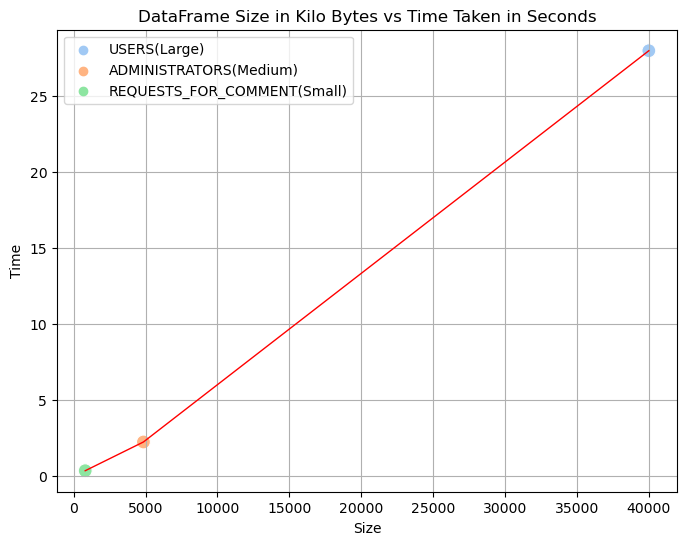

In [137]:
plt.figure(figsize=(8, 6))

# Scatter plot
sns.scatterplot(x="Size",
                y="Time",
                data=complexity_df,
                hue='Dataset',
                palette='pastel',
                s=100)

# Line plot
sns.lineplot(x="Size",
             y="Time",
             data=complexity_df,
             color='red',
             linewidth=1)

plt.title('DataFrame Size in Kilo Bytes vs Time Taken in Seconds')
plt.grid(True)
plt.legend()
plt.show()

Looks like the performance of the algorithm is satisfactory. It looks to have a linear time complexity in the graph as the time taken to build the graph increases linearly with the increase in the size of the network. But when we look at the **ratio** column in the data frame. We can see that the time taken decreases as the input size increases, which indicates an inverse relationship. Therefore, it's likely that the algorithm has a **logarithmic time complexity, expressed as O(log n)**, where n is the input size in kilobytes. 

## Task B (network metrics)

### What are the characteristic properties and relevant metrics and distributions of this Wikidata editor network?

**Basic Network Properties and Metrics**
- **number of nodes and edges**: these metrics provide fundamental information about the network's size and the relationships between its constituent entities. They provide a general sense of the network's scale and complexity.
- **density**:  it provides insight into how interconnected the nodes are within the network. A high density suggests strong connectivity, while a low density indicates sparsity.
- **number of connected components**: a large number of connected components indicates that the network is divided into distinct subgraphs, whereas a single connected component indicates a more cohesive network.
- **number of nodes in the largest connected components**: it aids in determining the network's core structure as well as the potential scope of influence or information dissemination.
- **average clustering coefficient**: measures the degree to which nodes in a network cluster together. It provides information about the presence of communities or tightly interconnected subgroups within the network.
- **average degrees of nodes**: it gives an indication of the overall level of connectivity in the network and helps identify nodes with high or low degrees of influence.

In [38]:
def network_fundamentals(G):
    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()
    density = nx.density(G)
    num_connected_components = nx.number_connected_components(G)
    largest_cc_size = len(max(nx.connected_components(G), key=len))
    clustering_coefficient = nx.average_clustering(G)
    degree_sequence = [d for _, d in G.degree()]
    avg_degree = sum(degree_sequence) / len(degree_sequence)
    
    print(f"Number of nodes: {num_nodes}")
    print(f"Number of edges: {num_edges}")
    print(f"Density: {density:.4f}")
    print(f"Number of connected components: {num_connected_components}")
    print(f"Number of nodes in the largest connected component: {largest_cc_size}")
    print(f"Average Clustering Coefficient: {clustering_coefficient:.4f}")
    print(f"Average degree of nodes: {avg_degree:.4f}")
    try: 
        diameter = nx.diameter(G)
        print("Diameter: {}".format(diameter))
    # For the graph that is not connected
    except:
        largest_cc = max(nx.connected_components(G), key=len)
        largest_cc_network = G.subgraph(largest_cc)
        diameter = nx.diameter(largest_cc_network)
        print("Diameter of largest connected components: {}".format(diameter))
    

In [39]:
# USERS.csv (LARGE NETWORK)
network_fundamentals(network1)

Number of nodes: 11387
Number of edges: 24692
Density: 0.0004
Number of connected components: 3262
Number of nodes in the largest connected component: 7767
Average Clustering Coefficient: 0.1827
Average degree of nodes: 4.3369
Diameter of largest connected components: 10


In [40]:
# ADMINISTRATORS.csv (MEDIUM NETWORK)
network_fundamentals(network2)

Number of nodes: 2258
Number of edges: 11915
Density: 0.0047
Number of connected components: 97
Number of nodes in the largest connected component: 2159
Average Clustering Coefficient: 0.6195
Average degree of nodes: 10.5536
Diameter of largest connected components: 6


In [41]:
# REQUESTS_FOR_COMMENT.csv (SMALL NETWORK)
network_fundamentals(network3)

Number of nodes: 888
Number of edges: 27569
Density: 0.0700
Number of connected components: 54
Number of nodes in the largest connected component: 833
Average Clustering Coefficient: 0.7818
Average degree of nodes: 62.0923
Diameter of largest connected components: 4


**Compare Node-Level Statistics (distributions)**

Compare the graphs by visualising the degrees, clustering coefficients, and closeness centrality of nodes.

In [42]:
def node_level_descriptors(graph):

    degrees = [d for _, d in graph.degree()]
    cluster = [d for _, d in nx.clustering(graph).items()]
    closeness = [d for _, d in nx.closeness_centrality(graph).items()]

    return {'degrees': degrees, 'ccoeffs': cluster, 'ccentra': closeness}

In [43]:
network1_desc = node_level_descriptors(network1)
network2_desc = node_level_descriptors(network2)
network3_desc = node_level_descriptors(network3)

Compare degrees

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


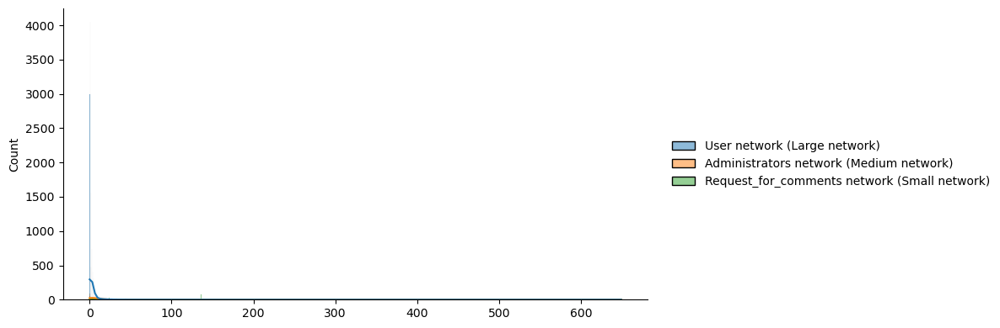

In [161]:
sns.displot({
    "User network (Large network)": network1_desc["degrees"],
    "Administrators network (Medium network)": network2_desc["degrees"],
    "Request_for_comments network (Small network)": network3_desc["degrees"]},
    height=4, aspect=2, kde=True)

Compare clustering coefficient

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


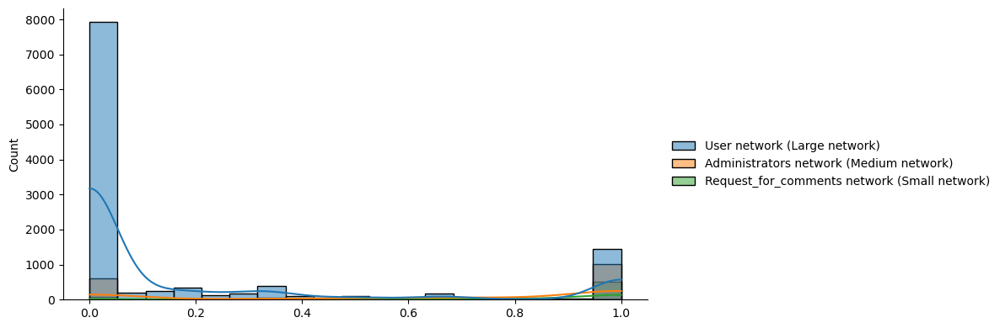

In [165]:
sns.displot({
    "User network (Large network)": network1_desc["ccoeffs"],
    "Administrators network (Medium network)": network2_desc["ccoeffs"],
    "Request_for_comments network (Small network)": network3_desc["ccoeffs"]},
    height=4, aspect=2, kde=True)

Compare closeness centrality

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


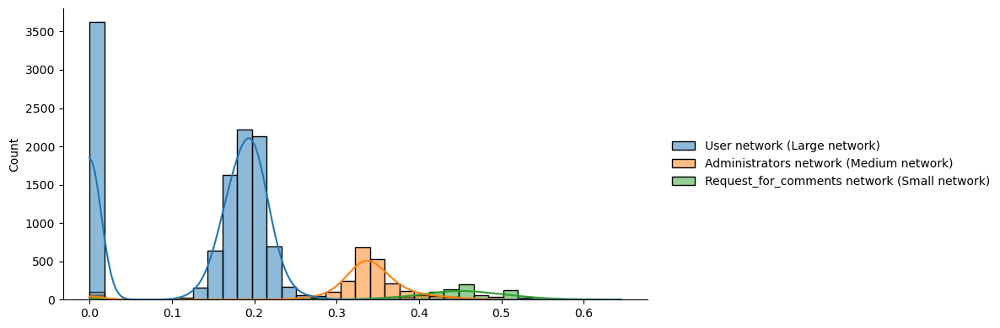

In [166]:
sns.displot({
    "User network (Large network)": network1_desc["ccentra"],
    "Administrators network (Medium network)": network2_desc["ccentra"],
    "Request_for_comments network (Small network)": network3_desc["ccentra"]},
    height=4, aspect=2, kde=True)

**Degree centrality**
- a measure of the importance of a node in a network based on the number of connections it has.
- a high degree centrality scores can imply that a node has a high number of connections for that graph

In [47]:
#print the top ten nodes by degree centrality
def degree_centrality(G):
    # Calculate degree centrality
    degree_centrality = nx.degree_centrality(G)

    # Sort nodes by degree centrality in descending order
    sorted_degree_centrality = {k: v for k, v in sorted(
        degree_centrality.items(), key=lambda item: item[1], reverse=True)}

    # Print top n nodes by degree centrality
    for i, (node, centrality) in enumerate(sorted_degree_centrality.items()):
        if i >= 10:
            break
        print(f"{node}: {centrality}")

In [48]:
degree_centrality(network1)

Infovarius: 0.05699982434568769
Jura1: 0.04962234322852626
Multichill: 0.03486738099420341
VIGNERON: 0.03451607236957668
Ymblanter: 0.032759529246443
Cycn: 0.03232039346565958
Ivan A. Krestinin: 0.028543825750922187
Andreasmperu: 0.0279290356578254
Epìdosis: 0.025294220973124892
GZWDer: 0.024503776567714738


In [49]:
degree_centrality(network2)

Ymblanter: 0.2410279131590607
MisterSynergy: 0.17279574656623836
Jasper Deng: 0.16880815241470978
DannyS712: 0.15595923792645103
Lymantria: 0.15064244572441293
Pamputt: 0.14665485157288435
Mahir256: 0.14045192733717324
Jura1: 0.13646433318564466
Bovlb: 0.1338059370846256
Ajraddatz: 0.10988037217545414


In [50]:
degree_centrality(network3)

Rschen7754: 0.5163472378804961
ArthurPSmith: 0.47688838782412624
Ymblanter: 0.47125140924464487
Stryn: 0.4317925591882751
TomT0m: 0.42164599774520856
Jasper Deng: 0.41149943630214203
GZWDer: 0.41037204058624577
ChristianKl: 0.4013528748590755
Pasleim: 0.39797068771138666
JAn Dudík: 0.3968432919954904


### What is the result of running the various shortest-path algorithms we have seen in class?
- Dijkstra's shortest path algorithm 
- Bellman-Ford

First, we create a function shortest path generator to compute the shortest path between two nodes in a given graph G, if the path exists. It uses two different algorithms for finding the shortest path: **Dijkstra's algorithm** and **Bellman-Ford algorithm**.

In [51]:
def shortest_path_generator(G, start_node, end_node):
    try:
        # Dijkstra's Shortest Path Algorithm
        dijkstra_path = nx.shortest_path(
            G, start_node, end_node, method='dijkstra')
        print("Dijkstra's Shortest Path Algorithm result from node {} to {}: {}".format(
            start_node, end_node, dijkstra_path))
        bellman_ford_path = nx.shortest_path(
            G, start_node, end_node, method='bellman-ford')
        print("Bellman-Ford Shortest Path Algorithm result from node {} to {}: {}".format(
            start_node, end_node, bellman_ford_path))
    except nx.NetworkXNoPath:
        print("No path exists between nodes {} and {}.".format(start_node, end_node))

In [52]:
# LARGE NETWORK
print("Large Network")
# no path exists
shortest_path_generator(network1, 'Infovarius', '寒吉')
# path exists
shortest_path_generator(network1, 'Infovarius', 'Filceolaire')

# MEDIUM NETWORK
print("Medium Network")
# no path exists
shortest_path_generator(network2, 'Ymblanter', 'AttoRenato')
# path exists
shortest_path_generator(network2, 'Ymblanter', 'Wiki13')

#SMALL NETWORK
print("Small Network")
# no path exists
shortest_path_generator(network3, 'Rschen7754', 'Anonymous_username_625')
# path exists
shortest_path_generator(network3, 'Rschen7754', 'MisterSynergy')

Large Network
No path exists between nodes Infovarius and 寒吉.
Dijkstra's Shortest Path Algorithm result from node Infovarius to Filceolaire: ['Infovarius', 'Filceolaire']
Bellman-Ford Shortest Path Algorithm result from node Infovarius to Filceolaire: ['Infovarius', 'Filceolaire']
Medium Network
No path exists between nodes Ymblanter and AttoRenato.
Dijkstra's Shortest Path Algorithm result from node Ymblanter to Wiki13: ['Ymblanter', 'Wiki13']
Bellman-Ford Shortest Path Algorithm result from node Ymblanter to Wiki13: ['Ymblanter', 'Wiki13']
Small Network
No path exists between nodes Rschen7754 and Anonymous_username_625.
Dijkstra's Shortest Path Algorithm result from node Rschen7754 to MisterSynergy: ['Rschen7754', 'MisterSynergy']
Bellman-Ford Shortest Path Algorithm result from node Rschen7754 to MisterSynergy: ['Rschen7754', 'MisterSynergy']


From the output, we can see that Dijkstra's Shortest Path algorithm and Bellman-Ford algorithm have the same output. The reason is our network is undirected and does not contain negative weight.

### Average shortest path length of the connected components

The average shortest path length of the connected components is an important metric for understanding the overall connectivity and efficiency of communication within a network. A smaller average shortest path length indicates that nodes in the network are more closely connected, making it easier for information to spread quickly from one node to another.


In [53]:
def average_path_length(G):
    # Get the connected components of the graph
    connected_components = list(nx.connected_components(G))

    # Find shortest path length for each connected component
    avg_path_lengths = []
    for component in connected_components:
        subgraph = G.subgraph(component)
        avg_path_lengths.append(nx.average_shortest_path_length(subgraph))

    # Calculate the average shortest path length
    overall_avg_path_length = sum(avg_path_lengths) / len(avg_path_lengths)

    return overall_avg_path_length

In [54]:
print(f"Average shortest path length of large network: {average_path_length(network1):.4f}")
print(f"Average shortest path length of medium network: {average_path_length(network2):.4f}")
print(f"Average shortest path length of small network: {average_path_length(network3):.4f}")

Average shortest path length of large network: 0.0836
Average shortest path length of medium network: 0.0597
Average shortest path length of small network: 0.0757


The medium-size network (administrators) has the lowest average shortest path length (0.0597) among the three, indicating that, on average, nodes are very close to each other. This suggests highly efficient communication and connectivity within the network. Meanwhile, the large network (users) has the highest average shortest path length (0.0757) among the three, suggesting that, on average, nodes are slightly farther apart compared to the medium (0.0597) and small networks. This could indicate slightly less efficient communication pathways or less direct connections between nodes.

### How different is this network from a random network, according to the various comparison criteria we have seen in class?


**1) Create Random network**

First, we need to generate Erdos-Renyi graph for which n and p match the number of nodes and frequency of edge occurrence in the real network. 

In [55]:
def generate_random_network(G):
    #Get the number of nodes and edges of the base network
    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()
    
    # Calculate the edge probability for the Erdős-Rényi model
    p = num_edges / (num_nodes * (num_nodes - 1) / 2)
    
    random_network = nx.erdos_renyi_graph(num_nodes, p)
    return random_network

In [56]:
random_network1 = generate_random_network(network1)
random_network2 = generate_random_network(network2)
random_network3 = generate_random_network(network3)

**2) Compare properties, metrics, and distribution between the real network and the generated random network**

**Compare characteristic properties and relevant metrics of user network and large random network**

In [57]:
print("Characteristic properties and relevant metrics of user network (Large network)")
network_fundamentals(network1)
print("Characteristic properties and relevant metrics of random network (Large network)")
network_fundamentals(random_network1)

Characteristic properties and relevant metrics of user network (Large network)
Number of nodes: 11387
Number of edges: 24692
Density: 0.0004
Number of connected components: 3262
Number of nodes in the largest connected component: 7767
Average Clustering Coefficient: 0.1827
Average degree of nodes: 4.3369
Diameter of largest connected components: 10
Characteristic properties and relevant metrics of random network (Large network)
Number of nodes: 11387
Number of edges: 24638
Density: 0.0004
Number of connected components: 156
Number of nodes in the largest connected component: 11229
Average Clustering Coefficient: 0.0005
Average degree of nodes: 4.3274
Diameter of largest connected components: 13


- The number of nodes in both networks are identical, indicating that they have the same size. 
- The user network has 24692 edges, while the random network has 24638 edges. Although the difference is small, it implies a slightly different level of connectivity between nodes.
- Despite the difference in the number of edges, both networks have the same density (0.0004), suggesting a similar level of connectivity relative to the maximum possible number of edges given the number of nodes.
- The user network has significantly more connected components (3262) compared to the random network (156), indicating a **higher level of fragmentation and isolation in the user network**.
- The size of the largest connected component in the user network is 7767 nodes, while in the random network, it is much larger with 11229 nodes.
This indicates that the random network has a more cohesive structure, with a larger proportion of nodes belonging to the largest connected component.
- The **user network has a substantially higher average clustering coefficient** (0.1827) compared to the random network (0.0005), indicating a higher degree of clustering or interconnectedness among neighboring nodes in the user network.
- The **average degree of nodes is very similar** between the two networks (4.3369 for the user network and 4.3274 for the random network).
- The diameter of the largest connected component in the user network is smaller (10) compared to the random network (13), suggesting more efficient communication pathways or closer connectivity among nodes in the user network's largest connected component.

Compare degrees between users network and  large random  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


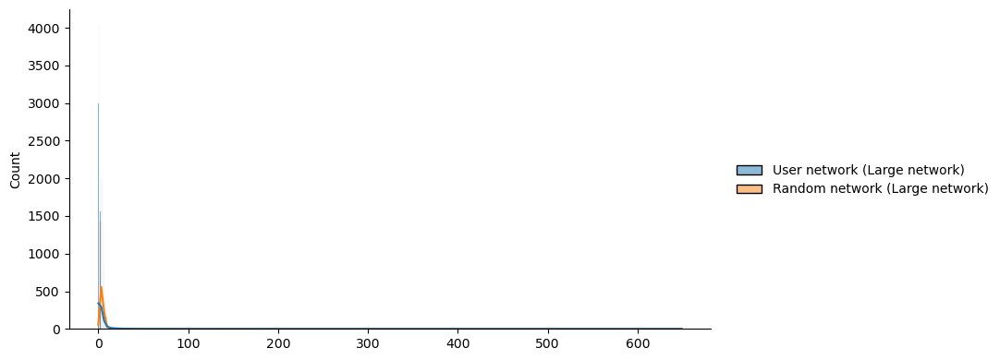

In [167]:
random_network1_desc = node_level_descriptors(random_network1)
sns.displot({
    "User network (Large network)": network1_desc["degrees"],
    "Random network (Large network)": random_network1_desc["degrees"],
    }, height=4, aspect=2, kde=True)

Compare clustering coefficient between users network and  large random  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


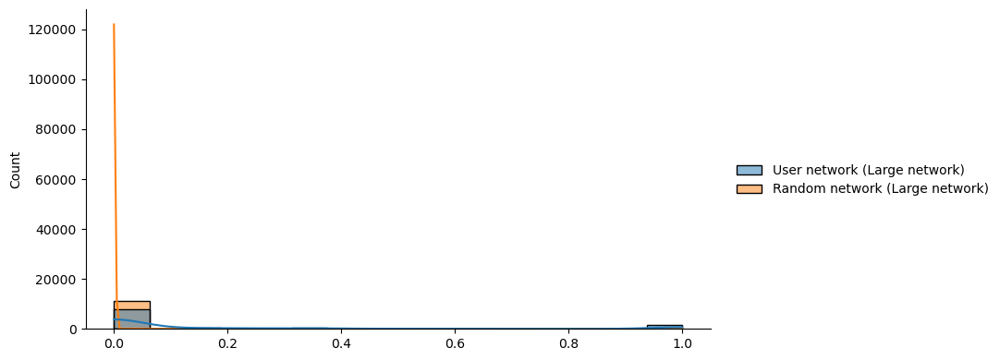

In [168]:
sns.displot({
    "User network (Large network)": network1_desc["ccoeffs"],
    "Random network (Large network)": random_network1_desc["ccoeffs"],
}, height=4, aspect=2, kde=True)

Compare closeness centrality between users network and  large random  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


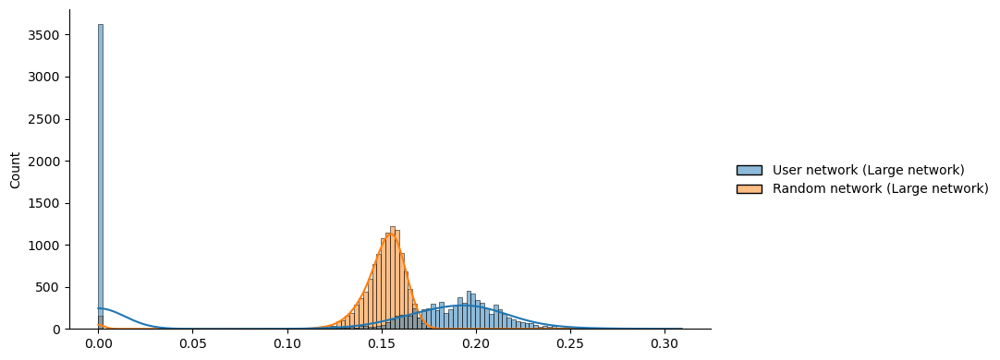

In [169]:
sns.displot({
    "User network (Large network)": network1_desc["ccentra"],
    "Random network (Large network)": random_network1_desc["ccentra"],
}, height=4, aspect=2, kde=True)

Compare average path length of the user network and large random network

In [61]:
print(
    f"Average shortest path length of users network: {average_path_length(network1):.4f}")
print(
    f"Average shortest path length of large random network: {average_path_length(random_network1):.4f}")

Average shortest path length of users network: 0.0836
Average shortest path length of large random network: 0.0610


Comparing these values, we can see that the average shortest path length is slightly higher in the user network (0.0836) compared to the large random network (0.0610). This suggests that, on average, nodes in the user network are slightly less closely connected than nodes in the large random network. 

**Compare administrators network and medium random network**

In [62]:
print("Characteristic properties and relevant metrics of administrators network (Medium network)")
network_fundamentals(network2)
print("Characteristic properties and relevant metrics of random network (Medium network)")
network_fundamentals(random_network2)

Characteristic properties and relevant metrics of administrators network (Medium network)
Number of nodes: 2258
Number of edges: 11915
Density: 0.0047
Number of connected components: 97
Number of nodes in the largest connected component: 2159
Average Clustering Coefficient: 0.6195
Average degree of nodes: 10.5536
Diameter of largest connected components: 6
Characteristic properties and relevant metrics of random network (Medium network)
Number of nodes: 2258
Number of edges: 11981
Density: 0.0047
Number of connected components: 1
Number of nodes in the largest connected component: 2258
Average Clustering Coefficient: 0.0049
Average degree of nodes: 10.6120
Diameter: 6


- Both the administrators network and the random network have the same number of nodes (2258) but differ slightly in the number of edges (11915 for the administrators network and 11981 for the random network).
- The density of both networks is the same (0.0047), indicating a similar level of connectivity relative to the total possible connections.
- The administrators network has 97 connected components, whereas the random network has only 1 connected component. This indicates that the **administrators network is more fragmented** or divided into smaller isolated groups compared to the random network.
- The administrators network has a largest connected component consisting of 2159 nodes, whereas the random network has a single connected component containing all 2258 nodes. This suggests that the administrators network has a significant portion of its nodes grouped together in a cohesive manner, despite the presence of multiple connected components.
- The average clustering coefficient is much higher in the administrators network (0.6195) compared to the random network (0.0049). This indicates a **higher level of local clustering or community structure in the administrators network**.
- The average degree of nodes is slightly lower in the administrators network (10.5536) compared to the random network (10.6120). This suggests that, on average, **nodes in the administrators network have slightly fewer connections** compared to the random network.
- Both the administrators network and the random network have the same diameter for their largest connected components, which is 6. This indicates that the **maximum distance between any pair of nodes within the largest connected component is the same for both networks**.


Compare degrees between administrators network and  medium random  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


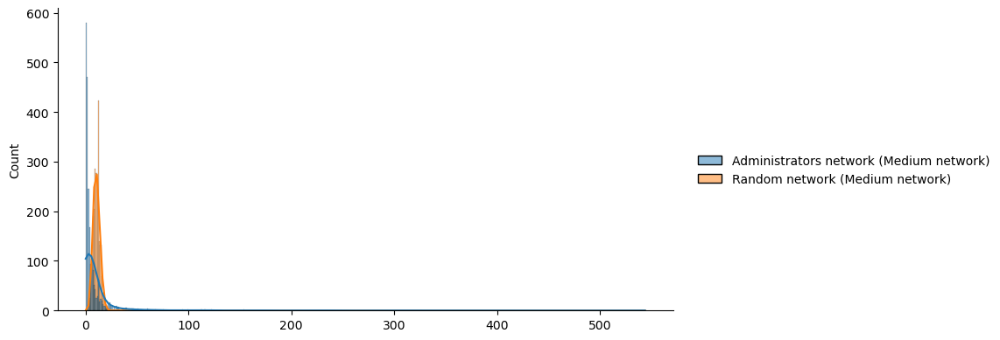

In [170]:
random_network2_desc = node_level_descriptors(random_network2)
sns.displot({
    "Administrators network (Medium network)": network2_desc["degrees"],
    "Random network (Medium network)": random_network2_desc["degrees"],
}, height=4, aspect=2, kde=True)

Compare clustering coefficients between administrators network and  medium random  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


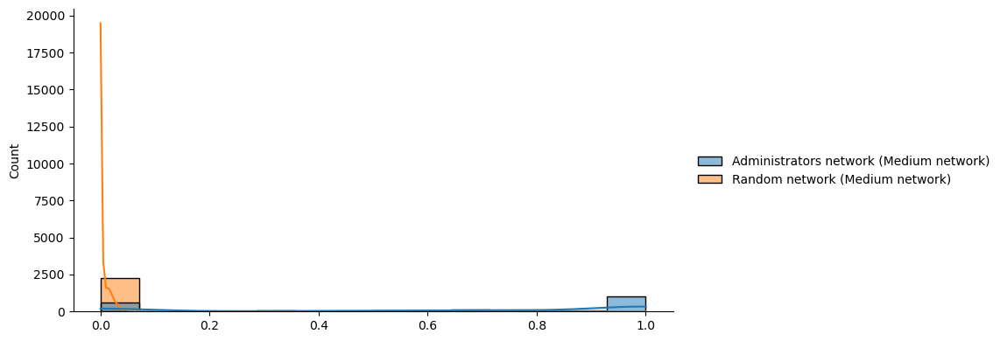

In [171]:
sns.displot({
    "Administrators network (Medium network)": network2_desc["ccoeffs"],
    "Random network (Medium network)": random_network2_desc["ccoeffs"],
}, height=4, aspect=2, kde=True)

Compare closeness centrality between administrators network and  medium random  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


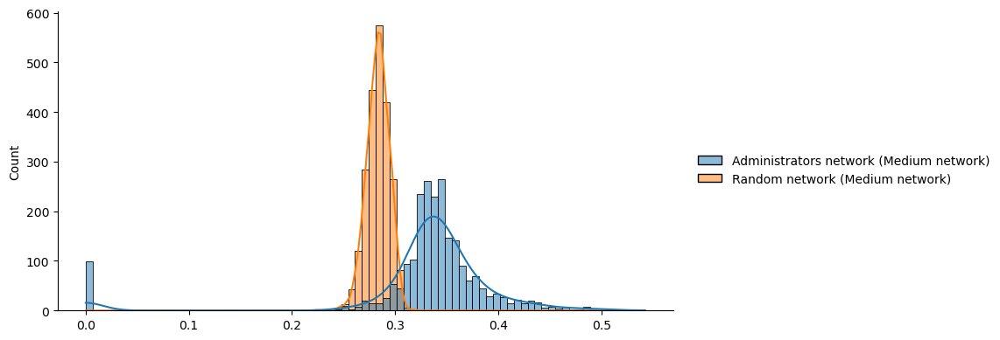

In [172]:
sns.displot({
    "Administrators network (Medium network)": network2_desc["ccentra"],
    "Random network (Medium network)": random_network2_desc["ccentra"],
}, height=4, aspect=2, kde=True)

Compare average path length of the administrators network and medium random network

In [66]:
print(
    f"Average shortest path length of administrators network: {average_path_length(network2):.4f}")
print(
    f"Average shortest path length of medium random network: {average_path_length(random_network2):.4f}")

Average shortest path length of administrators network: 0.0597
Average shortest path length of medium random network: 3.5359


 This short path length suggests that the administrators network is highly connected and efficient in terms of information or influence propagation. In contrast, the medium random network has a much longer average shortest path length of 3.5359. This suggests that it takes significantly more steps, on average, to reach any other node in the random network, indicating a less efficient spread of information or influence.

Compare requests_for_comments network and small random network

In [67]:
print("Characteristic properties and relevant metrics of requests_for_comments network (Small network)")
network_fundamentals(network3)
print("Characteristic properties and relevant metrics of random network (Small network)")
network_fundamentals(random_network3)

Characteristic properties and relevant metrics of requests_for_comments network (Small network)
Number of nodes: 888
Number of edges: 27569
Density: 0.0700
Number of connected components: 54
Number of nodes in the largest connected component: 833
Average Clustering Coefficient: 0.7818
Average degree of nodes: 62.0923
Diameter of largest connected components: 4
Characteristic properties and relevant metrics of random network (Small network)
Number of nodes: 888
Number of edges: 27540
Density: 0.0699
Number of connected components: 1
Number of nodes in the largest connected component: 888
Average Clustering Coefficient: 0.0700
Average degree of nodes: 62.0270
Diameter: 3


- Both the requests_for_comments network and the random network have the same number of nodes (888), but differ slightly in the number of edges (27569 for the requests_for_comments network and 276540 for the random network).
- The density of both networks is nearly identical (0.0700 for the requests_for_comments network and 0.0699 for the random network), indicating a similar level of connectivity relative to the total possible connections.
- The requests_for_comments network has 54 connected components, whereas the random network has only 1 connected component. This indicates that the **requests_for_comments network is more fragmented** or divided into smaller isolated groups compared to the random network.
- The requests_for_comments network has a largest connected component consisting of 833 nodes, whereas the random network has a single connected component containing all 888 nodes. This suggests that the requests_for_comments network has a significant portion of its nodes grouped together in a cohesive manner, despite the presence of multiple connected components.
- The average clustering coefficient is significantly higher in the requests_for_comments network (0.7818) compared to the random network (0.0700). This indicates a much **higher level of local clustering or community structure in the requests_for_comments network**.
- The average degree of nodes is substantially higher in the requests_for_comments network (62.0923) compared to the random network (62.0270). This suggests that, on average, nodes in the requests_for_comments network have slightly more connections compared to the random network.
- he diameter of the largest connected component is 4 for the requests_for_comments network, while it is 3 for the random network. This indicates that the **maximum distance between any pair of nodes within the largest connected component is slightly longer in the requests_for_comments** network compared to the random network.

Compare degrees between requests_for_comments network and  small random  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


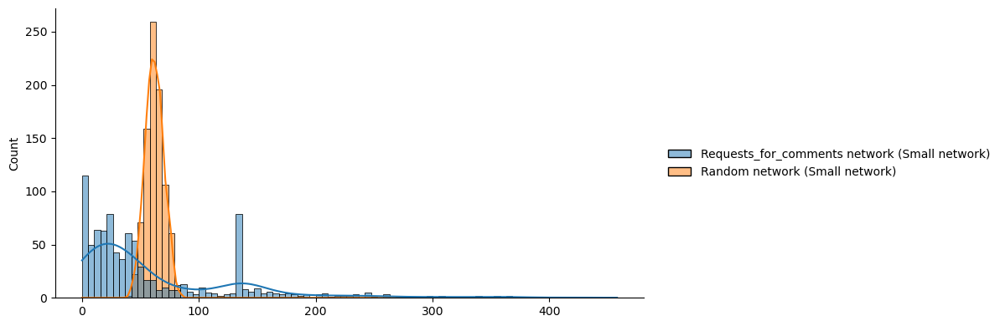

In [173]:
random_network3_desc = node_level_descriptors(random_network3)
sns.displot({
    "Requests_for_comments network (Small network)": network3_desc["degrees"],
    "Random network (Small network)": random_network3_desc["degrees"],
}, height=4, aspect=2, kde=True)

Compare clustering coefficients between requests_for_comments network and  medium random  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


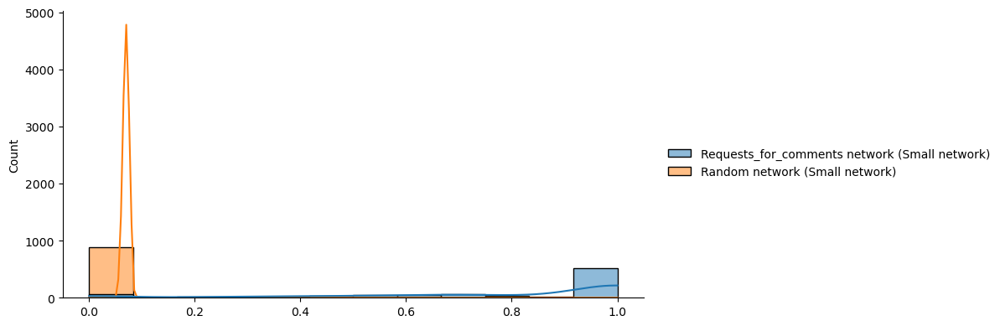

In [178]:
sns.displot({
    "Requests_for_comments network (Small network)": network3_desc["ccoeffs"],
    "Random network (Small network)": random_network3_desc["ccoeffs"],
}, height=4, aspect=2, kde=True)

Compare closeness centrality between requests_for_comments network and  medium random  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


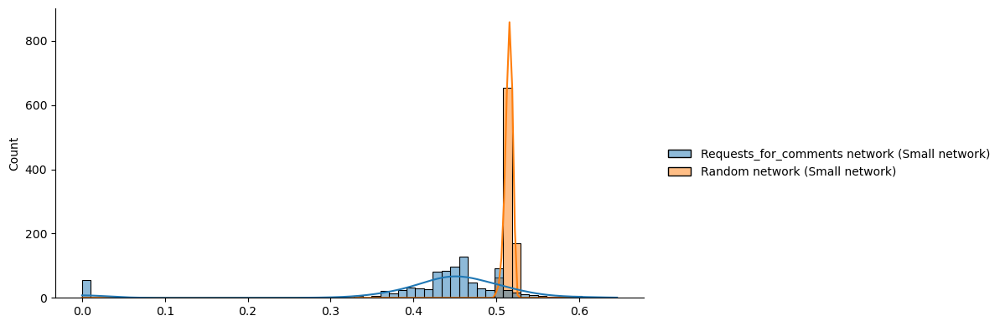

In [179]:
sns.displot({
    "Requests_for_comments network (Small network)": network3_desc["ccentra"],
    "Random network (Small network)": random_network3_desc["ccentra"],
}, height=4, aspect=2, kde=True)

Compare average path length of the administrators network and medium random network

In [71]:
print(
    f"Average shortest path length of requests_for_comments network: {average_path_length(network3):.4f}")
print(
    f"Average shortest path length of small random network: {average_path_length(random_network3):.4f}")

Average shortest path length of requests_for_comments network: 0.0757
Average shortest path length of small random network: 1.9424


The average shortest path length of the requests_for_comments network is 0.0757, whereas the average shortest path length of the small random network is 1.9424. This indicates that, on average, it takes fewer steps to navigate between any pair of nodes in the requests_for_comments network compared to the small random network.

**Summary**
- Both the real network and the random network exhibit identical numbers of nodes, though there are slight differences in the number of edges.
- Despite variations in the number of edges, both networks demonstrate similar densities, suggesting comparable levels of connectivity relative to the total possible connections.
- The real network consistently shows a higher number of connected components compared to the random network, indicating a higher degree of fragmentation and isolation.
- While both networks possess largest connected components, the real network's largest component tends to be smaller, indicating a less cohesive structure compared to the random network.
- the real network consistently exhibits significantly higher average clustering coefficients, suggesting a greater tendency for nodes to form tightly-knit clusters or groups compared to the random network.
- Although similar, the average degree of nodes in the real network can slightly vary compared to the random network, indicating potential differences in connectivity patterns.
-  The diameter of the largest connected component tends to be larger in the random network, implying longer maximum distances between nodes within this component compared to the real network.

### If you take this network as a complete and representative description of editor networks in collaborative knowledge projects like Wikipedia and Wikidata, what does it tell you about the way editors talk among themselves and their social activity and connections?

- The density of each network indicates the proportion of actual connections to possible connections. The administrators network has the highest density (0.0047), suggesting a relatively high level of interconnectedness among administrators compared to the total number of possible connections. This implies a more cohesive and tightly connected group of administrators. The users network has a much lower density (0.0004), indicating a sparser and more decentralized network structure among users.
-  The presence of multiple connected components in the users network (3,262) suggests a higher level of fragmentation or isolation among editors. This may indicate the existence of distinct subgroups or communities within the larger editor community, possibly based on interests, expertise, or editing patterns. In contrast, the administrators network has fewer connected components (97), indicating a more cohesive and unified group.
- The clustering coefficient measures the degree to which nodes in a network tend to cluster together. The higher clustering coefficients observed in the administrators network (0.6195) and requests_for_comments network (0.7818) suggest a higher level of local clustering or community structure among administrators and users engaging in discussions or providing feedback. This indicates the presence of tightly-knit groups or communities within these networks.
- The average shortest path length provides insights into the overall efficiency of information flow and communication within the network. The relatively low average shortest path lengths observed in all three networks (0.0836 for users, 0.0597 for administrators, and 0.0757 for requests_for_comments) indicate that it takes only a few steps to navigate between any pair of editors. This suggests a high degree of connectivity and efficient communication pathways within these networks.

### How does your analysis change (metrics, comparison to random, social behavior) if we now consider that two editors are connected iff they have both contributed to any thread in the same page, but not necessarily to the same thread?

**1) Generate network based on new edge creation condition**

In [72]:
def construct_wikidata_network_page(network):

    # storing the timestamp at which the graph generation starts to study the time complexity.
    start_time = time.time()

    G = nx.Graph()
    # Dictionary to store the set of usernames for each page
    page_users = {}  

    # Group users by page
    grouped_users = network.groupby('page_name')['username'].agg(set)

    end_date = datetime.datetime.now()
    start_date = end_date - datetime.timedelta(days=3650)  # 10 years from now. To randomly set a date in the last 10 years.

    for _, message in network.iterrows():
        thread_subject = message['thread_subject']
        username = message['username']
        page_name = message['page_name']
        comment_date = random_date(start_date, end_date) #format - datetime.datetime(year, month, day, hour, minute, second, microsecond)

        if pd.notna(username):
            # Node creation
            if not G.has_node(username):
                G.add_node(username, thread_subject=thread_subject,page_name=page_name, comment_date=comment_date)

        # Find users who have contributed to the same page (excluding the current user)
        same_page_users = set(grouped_users.get(page_name, set()))
        # Remove the current user to avoid self-loop
        same_page_users.discard(username)

        # Add edges between the current user and other users who contributed to the same page
        for other_user in same_page_users:
            if not G.has_edge(username, other_user):
                G.add_edge(username, other_user)

    end_time = time.time()
    total_time = end_time - start_time
    # total_time is how long the algorithm takes to generate a graph for the given dataset.

    return G, total_time


In [73]:
new_network1, time_new_network1 = construct_wikidata_network_page(users)
new_network2, time_new_network2 = construct_wikidata_network_page(administrators)
new_network3, time_new_network3 = construct_wikidata_network_page(request_for_comment)

**2) Compare old network - consider that two editors are connected iff they have both contributed to same thread in the same page thread and new network - consider that two editors are connected iff they have both contributed to any thread in the same page, but not necessarily to the same thread**

**Compare users network and new users network**

In [74]:
print("Characteristic properties and relevant metrics of original users network (Large network)")
network_fundamentals(network1)
print("Characteristic properties and relevant metrics of new users network (Large network)")
network_fundamentals(new_network1)

Characteristic properties and relevant metrics of original users network (Large network)
Number of nodes: 11387
Number of edges: 24692
Density: 0.0004
Number of connected components: 3262
Number of nodes in the largest connected component: 7767
Average Clustering Coefficient: 0.1827
Average degree of nodes: 4.3369
Diameter of largest connected components: 10
Characteristic properties and relevant metrics of new users network (Large network)
Number of nodes: 11387
Number of edges: 373777
Density: 0.0058
Number of connected components: 1002
Number of nodes in the largest connected component: 9948
Average Clustering Coefficient: 0.6989
Average degree of nodes: 65.6498
Diameter of largest connected components: 6


- Both the original and new user networks in the large network dataset have the same number of nodes (11387), but differ significantly in the number of edges (24692 for the original network and 373777 for the new network), **reflecting a substantial increase in connectivity in the new network**.
- The density of the new user network (0.0058) is notably higher than that of the original network (0.0004), indicating a **denser network with more connections relative to the total possible connections**.
- The original user network has 3262 connected components, whereas the new user network has 1002 connected components, indicating a **reduction in fragmentation and isolation in the new network compared to the original**.
- The largest connected component in the new user network encompasses 9948 nodes, while the original network's largest connected component includes 7767 nodes, suggesting a **larger cohesive group of users in the new network**.
- The average clustering coefficient significantly increases in the new user network (0.6989) compared to the original network (0.1827), indicating a **higher level of local clustering or community structure among users in the new network**.
- The diameter of the largest connected component decreases in the new user network (6) compared to the original network (10), indicating **shorter path lengths between nodes and improved overall network efficiency in the new network**.

Compare degrees between original users network and  new users network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


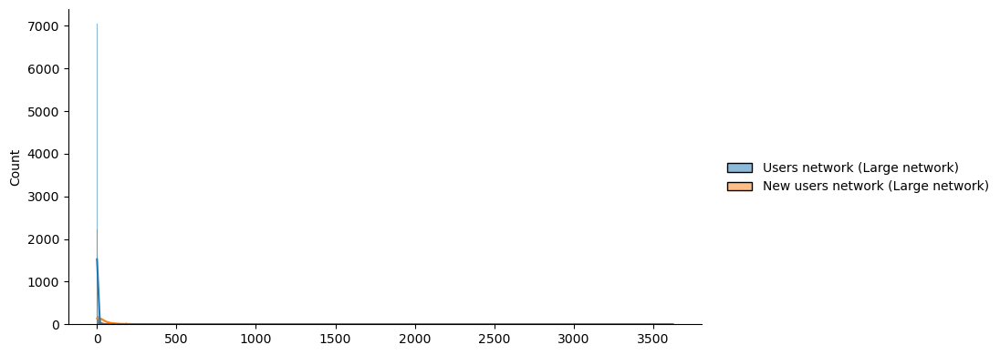

In [180]:
new_network1_desc = node_level_descriptors(new_network1)
sns.displot({
    "Users network (Large network)": network1_desc["degrees"],
    "New users network (Large network)": new_network1_desc["degrees"],
}, height=4, aspect=2, kde=True)

Compare clustering coefficients between original users network and new users network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


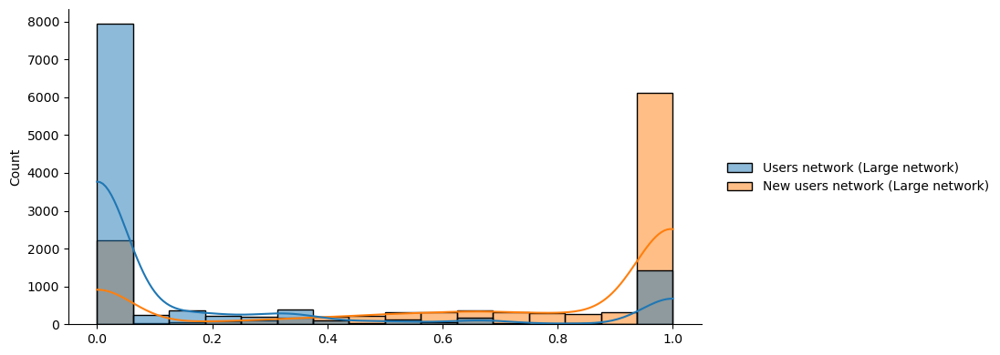

In [181]:
sns.displot({
    "Users network (Large network)": network1_desc["ccoeffs"],
    "New users network (Large network)": new_network1_desc["ccoeffs"],
}, height=4, aspect=2, kde=True)

Compare closeness centrality between original users network and new users network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


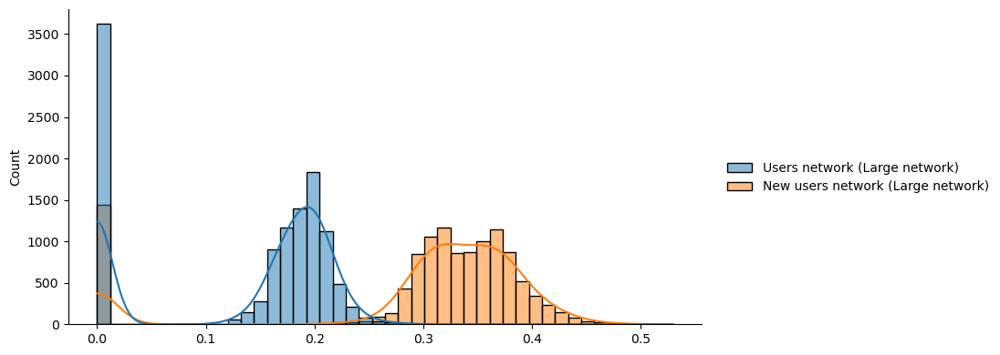

In [182]:
sns.displot({
    "Users network (Large network)": network1_desc["ccentra"],
    "New users network (Large network)": new_network1_desc["ccentra"],
}, height=4, aspect=2, kde=True)

Compare average path length between original users network and new users network

In [78]:
print(
    f"Average shortest path length of original users network: {average_path_length(network1):.4f}")
print(
    f"Average shortest path length of new users network: {average_path_length(new_network1):.4f}")

Average shortest path length of original users network: 0.0836
Average shortest path length of new users network: 0.0836


The average shortest path length remains consistent between the original users network and the new users network, indicating that, on average, the distance between any pair of nodes within the network remains unchanged despite modifications or updates. This suggests a stable and efficient communication structure within both versions of the users network.

**Compare orginal administrators network and new administrators network**

In [79]:
print("Characteristic properties and relevant metrics of original administrators network (Medium network)")
network_fundamentals(network2)
print("Characteristic properties and relevant metrics of new administrators network (Medium network)")
network_fundamentals(new_network2)

Characteristic properties and relevant metrics of original administrators network (Medium network)
Number of nodes: 2258
Number of edges: 11915
Density: 0.0047
Number of connected components: 97
Number of nodes in the largest connected component: 2159
Average Clustering Coefficient: 0.6195
Average degree of nodes: 10.5536
Diameter of largest connected components: 6
Characteristic properties and relevant metrics of new administrators network (Medium network)
Number of nodes: 2258
Number of edges: 179937
Density: 0.0706
Number of connected components: 2
Number of nodes in the largest connected component: 2257
Average Clustering Coefficient: 0.8458
Average degree of nodes: 159.3773
Diameter of largest connected components: 3


- Both the original and new administrators networks in the medium network dataset have the same number of nodes (2258), but differ significantly in the number of edges (11915 for the original network and 179937 for the new network), **reflecting a substantial increase in connectivity in the new network**.
- The density of the new administrators network (0.0706) is notably higher than that of the original network (0.0047), indicating a **denser network with more connections relative to the total possible connections in the new network**.
- The original administrators network has 97 connected components, whereas the new administrators network has only 2 connected components, indicating a **significant reduction in fragmentation and isolation in the new network compared to the original**.
- The largest connected component in the new administrators network encompasses 2257 nodes, while the original network's largest connected component includes 2159 nodes, suggesting a **larger cohesive group in the new network**.
- The average clustering coefficient significantly increases in the new administrators network (0.8458) compared to the original network (0.6195), indicating a **higher level of local clustering or community structure in the new network**.
- The diameter of the largest connected component decreases in the new administrators network (3) compared to the original network (6), indicating **shorter path lengths between nodes and improved overall network efficiency in the new network**.

Compare degrees between original administrators network and new administrators network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


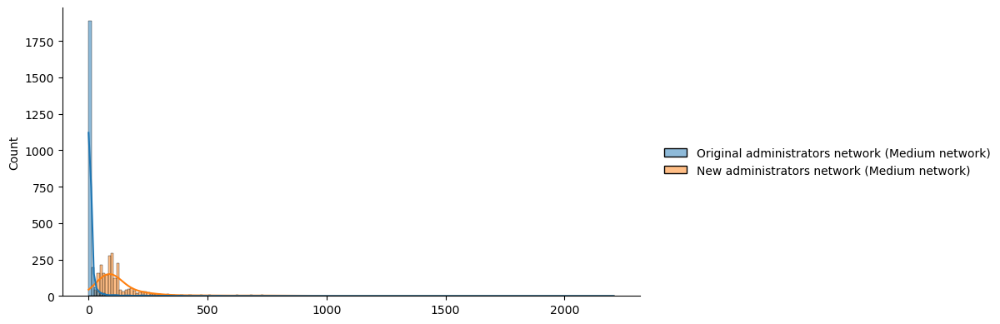

In [183]:
new_network2_desc = node_level_descriptors(new_network2)
sns.displot({
    "Original administrators network (Medium network)": network2_desc["degrees"],
    "New administrators network (Medium network)": new_network2_desc["degrees"],
}, height=4, aspect=2, kde=True)

Compare clustering coefficients between original administrators network and new administrators network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


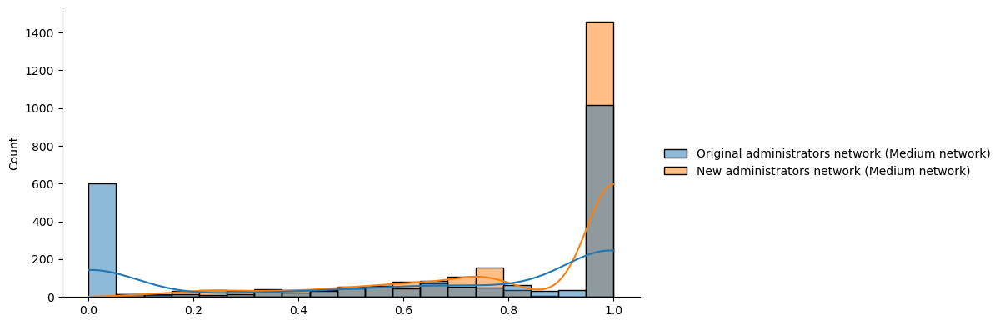

In [184]:
sns.displot({
    "Original administrators network (Medium network)": network2_desc["ccoeffs"],
    "New administrators network (Medium network)": new_network2_desc["ccoeffs"],
}, height=4, aspect=2, kde=True)

Compare closeness centrality between original administrators network and new administrators network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


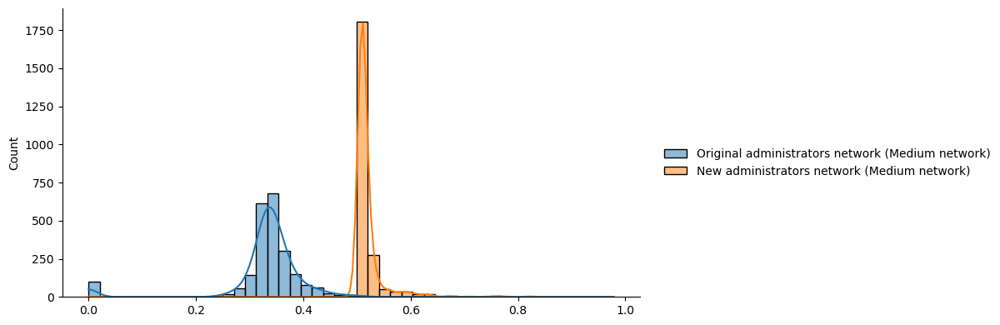

In [185]:
sns.displot({
    "Original administrators network (Medium network)": network2_desc["ccentra"],
    "New administrators network (Medium network)": new_network2_desc["ccentra"],
}, height=4, aspect=2, kde=True)

Compare average path length between original administrators network and new administrators network

In [83]:
print(
    f"Average shortest path length of original administrators network: {average_path_length(network2):.4f}")
print(
    f"Average shortest path length of new administrators network: {average_path_length(new_network2):.4f}")

Average shortest path length of original administrators network: 0.0597
Average shortest path length of new administrators network: 0.9647


The average shortest path length in the original administrators network (0.0597) is significantly lower than that in the new administrators network (0.9647), indicating that, on average, nodes in the original network are more closely connected and can reach each other more quickly compared to the new network. 

**Compare original requests_for_comments network and new requests_for_comments network**

In [84]:
print("Characteristic properties and relevant metrics of original requests_for_comments network (Medium network)")
network_fundamentals(network3)
print("Characteristic properties and relevant metrics of new requests_for_comments network (Medium network)")
network_fundamentals(new_network3)

Characteristic properties and relevant metrics of original requests_for_comments network (Medium network)
Number of nodes: 888
Number of edges: 27569
Density: 0.0700
Number of connected components: 54
Number of nodes in the largest connected component: 833
Average Clustering Coefficient: 0.7818
Average degree of nodes: 62.0923
Diameter of largest connected components: 4
Characteristic properties and relevant metrics of new requests_for_comments network (Medium network)
Number of nodes: 888
Number of edges: 27569
Density: 0.0700
Number of connected components: 54
Number of nodes in the largest connected component: 833
Average Clustering Coefficient: 0.7818
Average degree of nodes: 62.0923
Diameter of largest connected components: 4


- Both the original and new requests_for_comments networks in the medium network dataset have the same number of nodes (888) and edges (27569), indicating **no change in connectivity between the two networks**.
- The density of both networks remains identical at 0.0700, suggesting a **consistent level of connectivity relative to the total possible connections**.
- Both the original and new requests_for_comments networks have 54 connected components, indicating **no change in the level of fragmentation and isolation between the two networks**.
- The size of the largest connected component in both networks is 833 nodes, indicating that the **largest cohesive group of nodes remains unchanged between the two networks**.
- The average clustering coefficient also remains the same at 0.7818 for both the original and new networks, indicating **consistent levels of local clustering or community structure**.
- The average degree of nodes is identical at 62.0923 for both networks, suggesting that **nodes in both networks have a similar number of connections on average**.
- The diameter of the largest connected component also remains unchanged at 4 for both networks, indicating **consistent maximum distances between nodes within this component**.

Compare degrees between requests_for_comments network and  new requests_for_comments  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


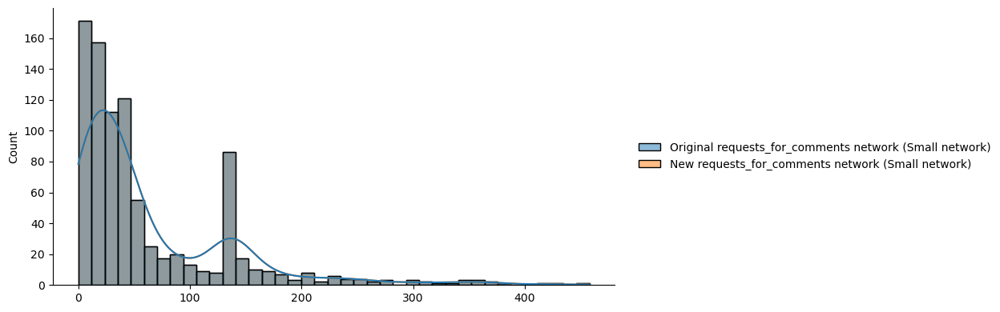

In [186]:
new_network3_desc = node_level_descriptors(new_network3)
sns.displot({
    "Original requests_for_comments network (Small network)": network3_desc["degrees"],
    "New requests_for_comments network (Small network)": new_network3_desc["degrees"],
}, height=4, aspect=2, kde=True)

Compare clustering coefficients between requests_for_comments network and  new requests_for_comments  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


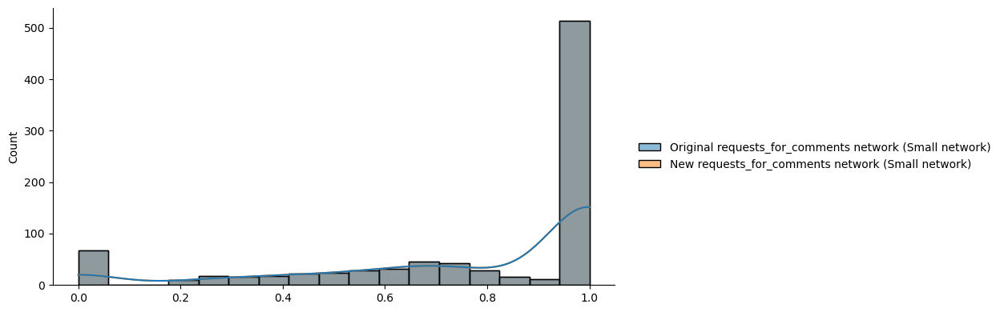

In [187]:
sns.displot({
    "Original requests_for_comments network (Small network)": network3_desc["ccoeffs"],
    "New requests_for_comments network (Small network)": new_network3_desc["ccoeffs"],
}, height=4, aspect=2, kde=True)

Compare closeness centrality between requests_for_comments network and  new requests_for_comments  network

C:\Users\patta\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


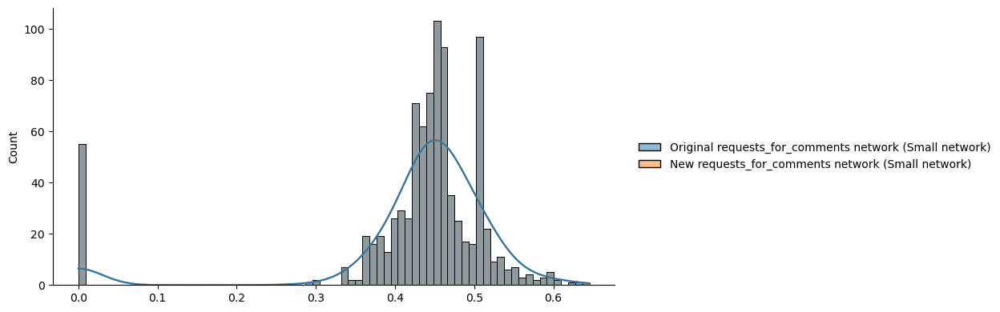

In [188]:
sns.displot({
    "Original requests_for_comments network (Small network)": network3_desc["ccentra"],
    "New requests_for_comments network (Small network)": new_network3_desc["ccentra"],
}, height=4, aspect=2, kde=True)

Compare average path length between requests_for_comments network and  new requests_for_comments  network

In [88]:
print(
    f"Average shortest path length of original requests_for_comments network: {average_path_length(network3):.4f}")
print(
    f"Average shortest path length of new requests_for_comments network: {average_path_length(new_network3):.4f}")

Average shortest path length of original requests_for_comments network: 0.0757
Average shortest path length of new requests_for_comments network: 0.0757


The average shortest path length remains unchanged between the original and new requests_for_comments networks, both recording a value of 0.0757. This suggests that, despite potential changes or updates in the network, the overall efficiency of communication and information flow between nodes remains consistent.

**Summary**

The analysis remains the same for Request_for_comments.csv network

For the Users.csv and Administrators.csv networks, we can observe that the number of edges increase, increasing connectivity in the new network. The new networks are more dense comparing to the density of the original networks. Additionally, there are significant reduction in fragmentation and isolation in the new networks compared to the original networks. From the number of largest connected component and average clustering coefficient values, they indicate that there are larger cohesive group of in the new networks and higher level of local clustering or community structure among administrators in the new network, respectively. The diameter of the network also decrease which means the maximum number of steps to travel to other nodes are decreased, making them easier to connect and improved overall network efficiency in the new network. The average path length in both original users network and new users network remain unchanged, while the new administrators network's average path length increases.

## Task C (epidemic models)

Here, to study how opinions and behind-the-scenes knowledge expand and propagate among editors, we take a look at the editors who commented the most in a page and a thread as there is a chance that these comments can lead to something controversial and can lead to other editors also getting influenced by this and getting infected. 

We use the Threshold and SIR models to analyse the networks we have built till now and then compare the two models. We consider a worst, average, and best case for these models by initialising the infected nodes with the users with most, median and least comments in a page and thread respectively.

Instead of randomly picking 2 pages which can be analysed, we have picked two pages each for a best case, mid case and a worst scenario.<br>
<br>
Two pages with the most comments will be the worst case as they will have a high chance of propogation. We have also picked two pages with median number of comments and two with the least comments that will be the best case scenario with the least chance of propagation. <br>

We then pick one username with the most comments on that talk pages which will be the infected nodes for analysis using Threshold and SIR models.
<br>

**For the below code :**
<br>

**Network 1 is Large Network (USERS)**

**Network 2 is Medium Network (ADMINISTRATORS)**

**Network 3 is Small Network (REQUEST FOR COMMENT)** <br>
s

In [89]:
# Function to find page names with most, least, and median comments
def find_page_names(df):
    # Group data by 'page_name' and count comments
    comment_counts = df.groupby('page_name').size().reset_index(name='comment_count')
    
    # Sort comments based on comment counts
    sorted_comments = comment_counts.sort_values(by='comment_count')
    
    # Find most, least, and median comment counts
    most_comments_pages = sorted_comments.iloc[-2:]['page_name'].tolist()
    least_comments_pages = sorted_comments.iloc[:2]['page_name'].tolist()
    median_comments_pages = sorted_comments.iloc[len(sorted_comments) // 2 - 1:len(sorted_comments) // 2 + 1]['page_name'].tolist()
    
    return most_comments_pages, least_comments_pages, median_comments_pages

In [90]:
# Function to select one username from each page based on comment counts
def get_infected(df, page_names):
    usernames = []
    for page_name in page_names:
        # Filter dataframe for the specified page name
        page_df = df[df['page_name'] == page_name]
        # Get one username with the most comments in the page
        most_comments_user = page_df['username'].value_counts().idxmax()
        # Add the username to the list
        usernames.append(most_comments_user)
    return usernames

In [91]:
#Function to build a threshold model of 20 iterations. 20 has been chosen after careful consideration as almost all the models below fully propogate
#in around 15-20 iterations

def build_threshold_model(graph, fraction, init_infected):
    model = epidemics.ThresholdModel(graph)
    model_config = config.Configuration()

    # Add initial infected nodes to the model configuration
    model_config.add_model_initial_configuration("Infected", init_infected)

    # Add threshold configuration for each node
    for node in graph.nodes():
        model_config.add_node_configuration("threshold", node, fraction)
        
    # Set the initial status of the model
    model.set_initial_status(model_config)

    # Run iterations of the model
    iterations = model.iteration_bunch(20)

    # Build trends based on model iterations
    trends = model.build_trends(iterations)

    return model, trends

In [92]:
def visualise_threshold_model(model, trends):
    viz = DiffusionTrend(model, trends)
    viz.plot()
    plt.show()

In [93]:
#Function to build an SIR model of 200 iterations.

def build_sir_model(graph, init_infected):
    model = epidemics.SIRModel(graph)
    model_config = config.Configuration()

    model_config.add_model_parameter('beta', 0.01)
    model_config.add_model_parameter('gamma', 0.01)
    model_config.add_model_parameter("fraction_infected", 0.1)

    model_config.add_model_initial_configuration("Infected", init_infected)
        
    model.set_initial_status(model_config)

    iterations = model.iteration_bunch(200)
    trends = model.build_trends(iterations)

    return model, trends

In [94]:
def visualise_sir_model(model, trends):
    viz = DiffusionTrend(model, trends)
    viz.plot()
    plt.show()

    viz = DiffusionPrevalence(model, trends)
    viz.plot()
    plt.show()

In [95]:
# Find 2 page names each with most, least, and median comments for network one - USERS
most_comments_page_network1, least_comments_page_network1, median_comments_page_network1 = find_page_names(users)

In [96]:
#To fetch the infected nodes for network 1. 1 user each for a page.
most_infected_network1= get_infected(users, most_comments_page_network1)
least_infected_network1 = get_infected(users, least_comments_page_network1)
median_infected_network1 = get_infected(users, median_comments_page_network1)

### Network 1

We build a threshold model for all the three networks. For every network we build a threshold model for the best, median and worst scenario with a threshold of 10%. <br>
<br>
By running the threshold model on your network data, we can simulate the spread of behavior starting from the initially infected editors (those with the most comments). We can then observe how this behavior propagates through the network over time and assess whether it reaches neighboring similar editors (those with similar commenting patterns (users who commented on the same page and thread)).

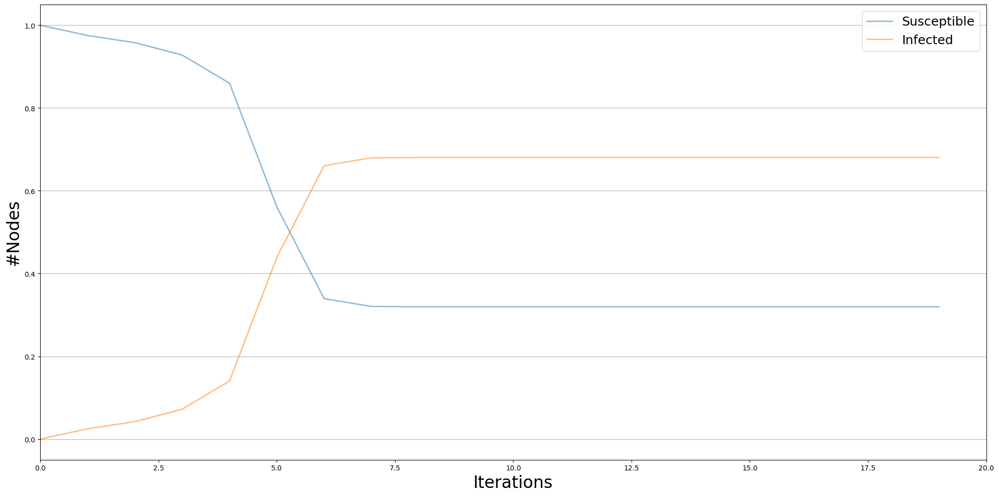

In [189]:
worst_threshold_network1_model, worst_threshold_network1_trends = build_threshold_model(network1, 0.1, most_infected_network1)
visualise_threshold_model(worst_threshold_network1_model, worst_threshold_network1_trends)

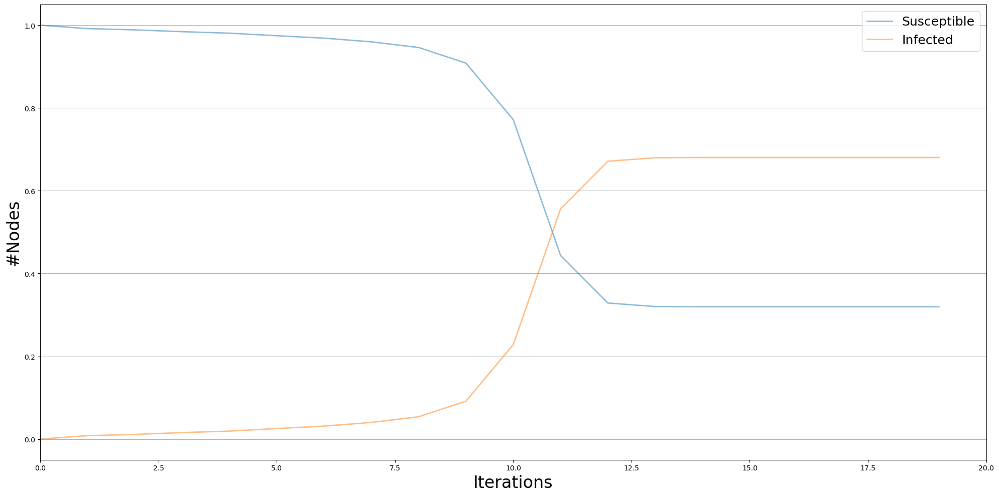

In [190]:
mid_threshold_network1_model, mid_threshold_network1_trends = build_threshold_model(network1, 0.1, median_infected_network1)
visualise_threshold_model(mid_threshold_network1_model, mid_threshold_network1_trends)

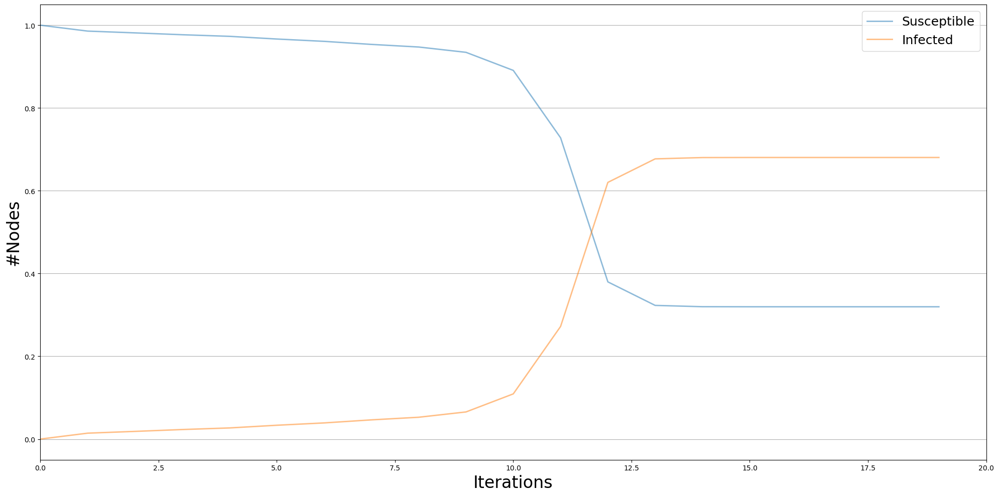

In [191]:
best_threshold_network1_model,  best_threshold_network1_trends = build_threshold_model(network1, 0.1, least_infected_network1)
visualise_threshold_model(best_threshold_network1_model,  best_threshold_network1_trends)

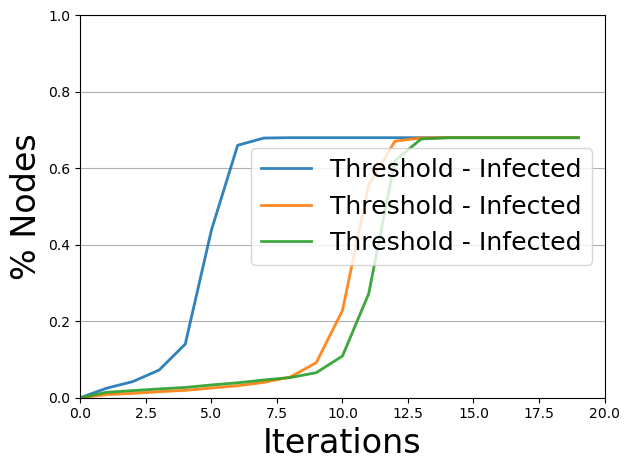

In [192]:
viz = DiffusionTrendComparison(
    [worst_threshold_network1_model, mid_threshold_network1_model, best_threshold_network1_model],
    [worst_threshold_network1_trends, mid_threshold_network1_trends, best_threshold_network1_trends],
    statuses = ['Infected'])

viz.plot ()
plt.show()

We can see that there is a clear difference between how the network gets infected in the worst case scenario when compared to the median and best case scenarios. <br>

The worst-case scenario has two users from the pages with the most comments in the USERS network and when these users are infected, the behaviour spread much quicker when compared to nodes from pages with less number of comments.

### Network 2

In [193]:
# Find page names with most, least, and median comments
most_comments_page_network2, least_comments_page_network2, median_comments_page_network2 = find_page_names(administrators)

In [194]:
most_infected_network2= get_infected(administrators, most_comments_page_network2)
least_infected_network2 = get_infected(administrators, least_comments_page_network2)
median_infected_network2 = get_infected(administrators, median_comments_page_network2)

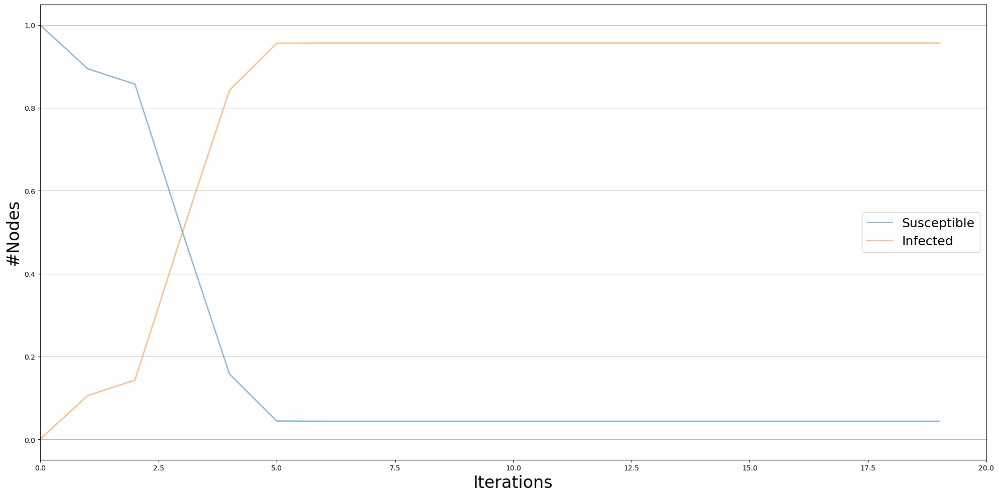

In [195]:
worst_threshold_network2_model, worst_threshold_network2_trends = build_threshold_model(network2, 0.1, most_infected_network2)
visualise_threshold_model(worst_threshold_network2_model, worst_threshold_network2_trends)

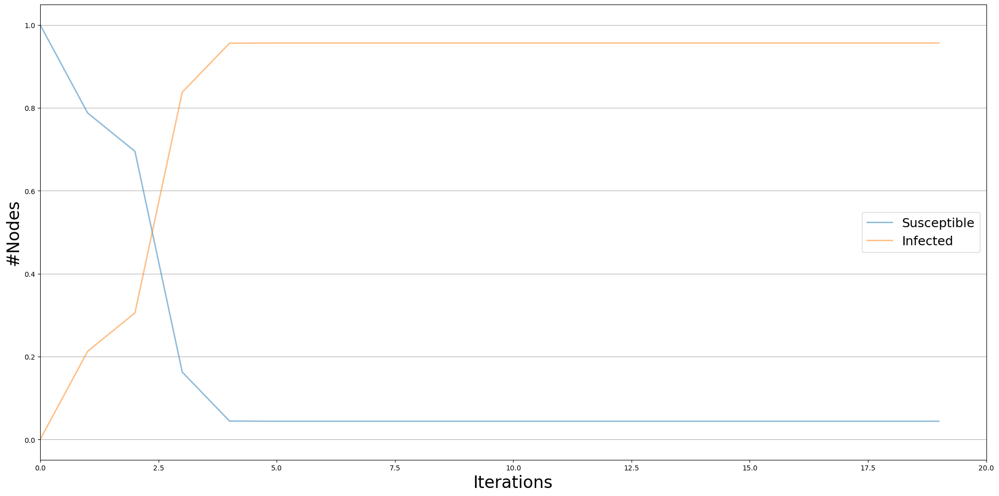

In [196]:
mid_threshold_network2_model, mid_threshold_network2_trends = build_threshold_model(network2, 0.1, median_infected_network2)
visualise_threshold_model(mid_threshold_network2_model, mid_threshold_network2_trends)

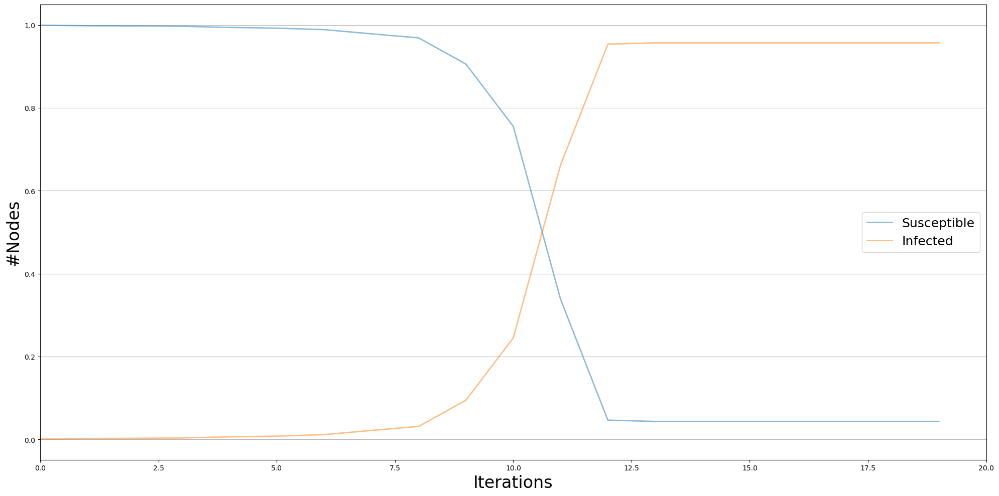

In [197]:
best_threshold_network2_model,  best_threshold_network2_trends = build_threshold_model(network2, 0.1, least_infected_network2)
visualise_threshold_model(best_threshold_network2_model,  best_threshold_network2_trends)

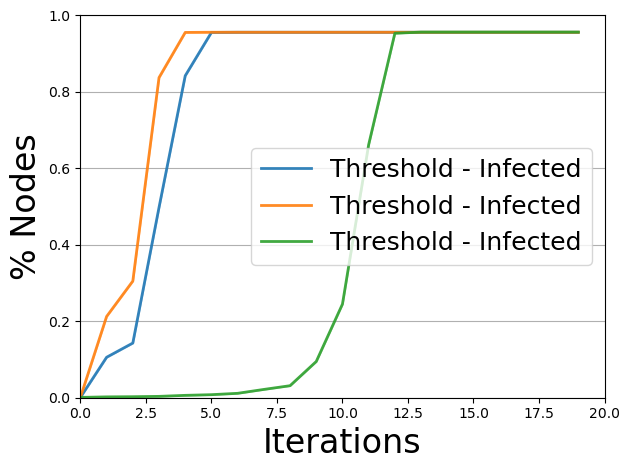

In [198]:
viz = DiffusionTrendComparison(
    [worst_threshold_network2_model, mid_threshold_network2_model, best_threshold_network2_model],
    [worst_threshold_network2_trends, mid_threshold_network2_trends, best_threshold_network2_trends],
    statuses = ['Infected'])

viz.plot ()
plt.show()

In the comparision of threshold models of Network 2, we can see that the worst and median cases spread to almost 90% nodes in around 3-4 iterations, while the best case takes around 11 iterations.

When compared to Network 1, here the spread is much wider. The behaviour is spread to more than 90% of the nodes very quickly. This means that the Foundation needs to be very careful with such networks as they can be spread very easily to all the users very quickly. 

### Network 3

In [199]:
# Find page names with most, least, and median comments
most_comments_page_network3, least_comments_page_network3, median_comments_page_network3 = find_page_names(request_for_comment)

In [200]:
most_infected_network3 = get_infected(request_for_comment, most_comments_page_network3)
least_infected_network3 = get_infected(request_for_comment, least_comments_page_network3)
median_infected_network3 = get_infected(request_for_comment, median_comments_page_network3)

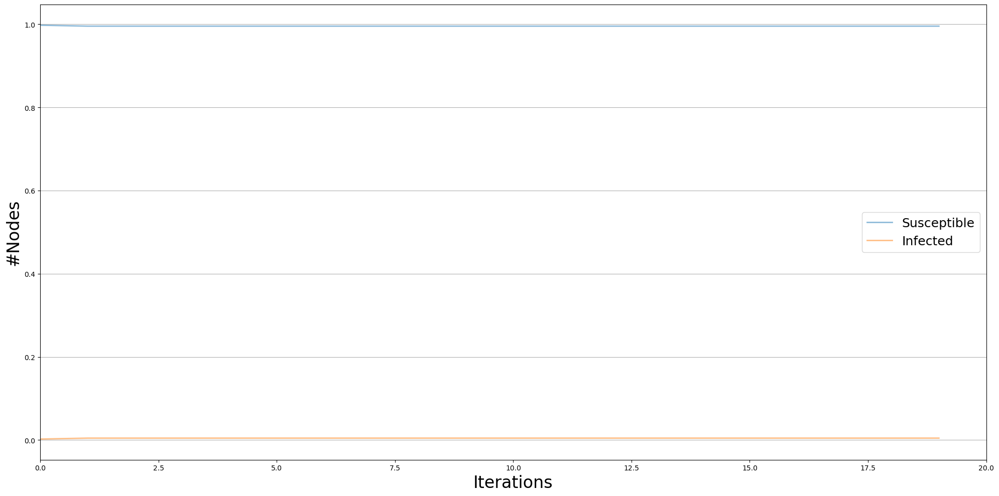

In [201]:
worst_threshold_network3_model, worst_threshold_network3_trends = build_threshold_model(network3, 0.1, most_infected_network3)
visualise_threshold_model(worst_threshold_network3_model, worst_threshold_network3_trends)

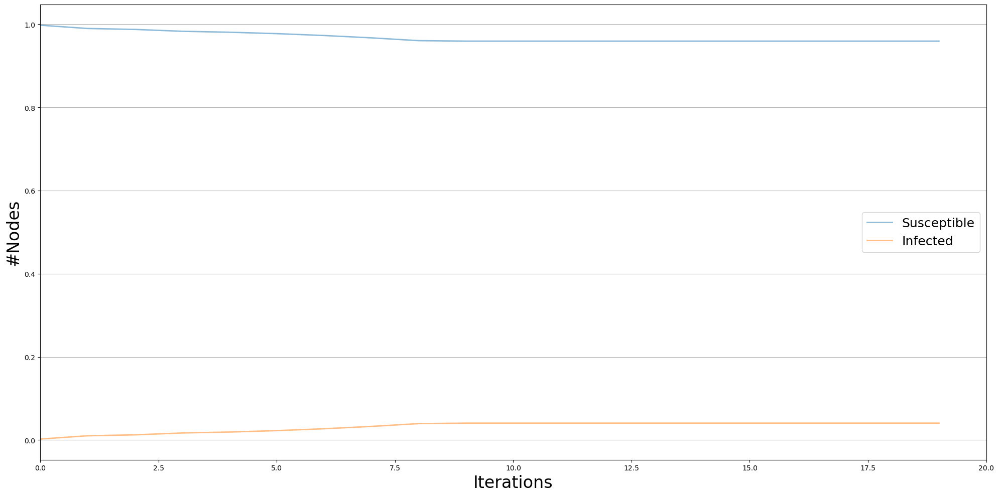

In [202]:
mid_threshold_network3_model, mid_threshold_network3_trends = build_threshold_model(network3, 0.1, median_infected_network3)
visualise_threshold_model(mid_threshold_network3_model, mid_threshold_network3_trends)

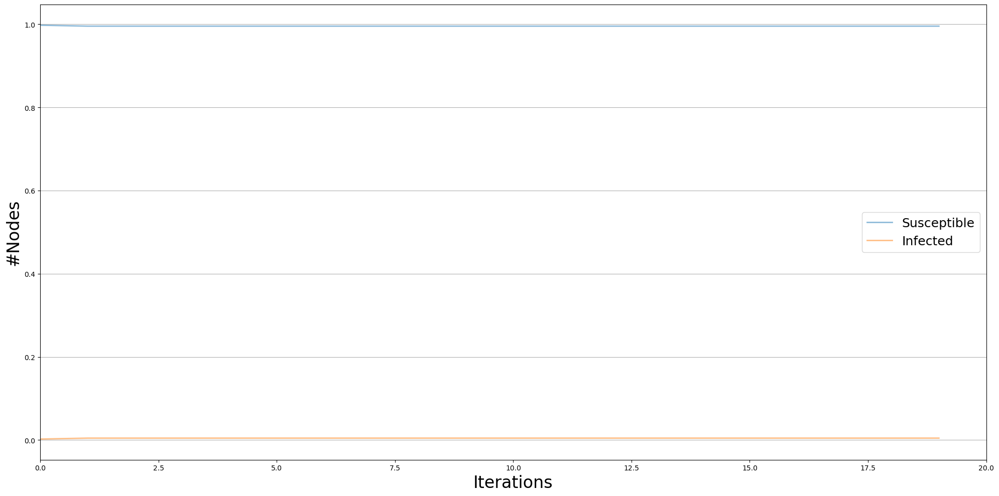

In [203]:
best_threshold_network3_model,  best_threshold_network3_trends = build_threshold_model(network3, 0.1, least_infected_network3)
visualise_threshold_model(best_threshold_network3_model,  best_threshold_network3_trends)

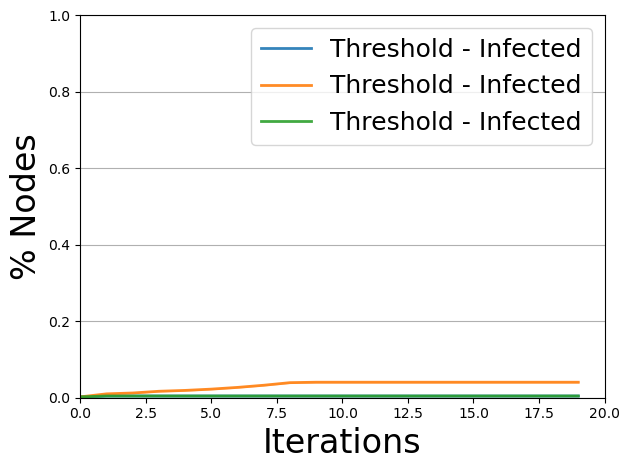

In [204]:
viz = DiffusionTrendComparison(
    [worst_threshold_network3_model, mid_threshold_network3_model, best_threshold_network3_model],
    [worst_threshold_network3_trends, mid_threshold_network3_trends, best_threshold_network3_trends],
    statuses = ['Infected'])

viz.plot ()
plt.show()

In network 3, the threshold models on all three cases do not spread to the network at all. This could be because of the users and how they might be connected with each other. 


Even in the worst case scenario, the behaviour doesnt spread to more than 10% of the users.

### SIR model (susceptible, infected, recovered)

The SIR model divides the population into three compartments: Susceptible, Infectious, and Recovered. In your case, editors who have commented more than usual could be considered "Infectious". By simulating the dynamics of the SIR model on your network data, we can observe how the behavior spreads over time and how many neighboring editors become infected.


### Network 1

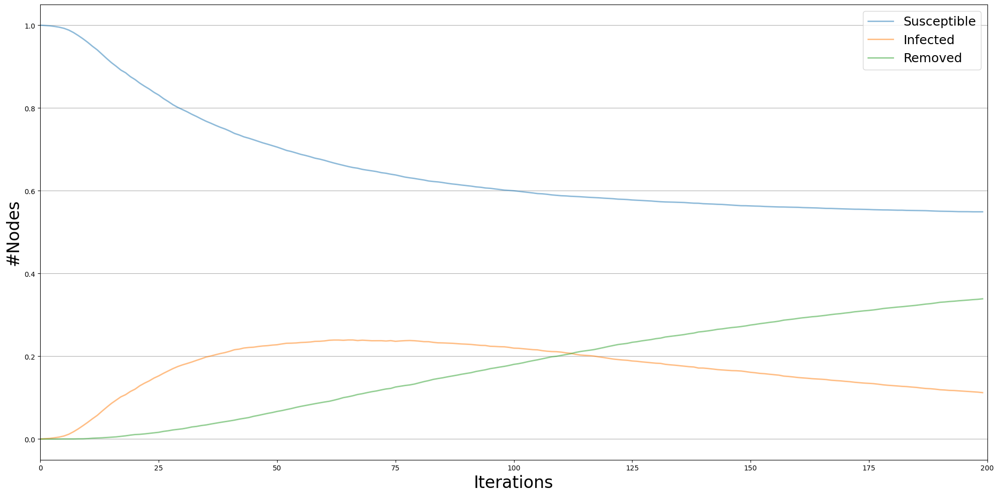

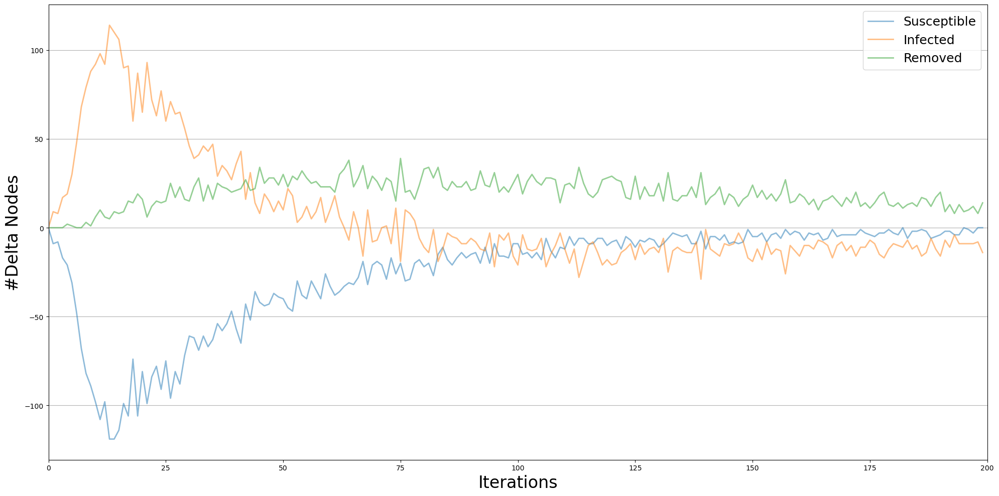

In [205]:
worst_sir_network1_model, worst_sir_network1_trends = build_sir_model(network1, most_infected_network1)
visualise_sir_model(worst_sir_network1_model, worst_sir_network1_trends)

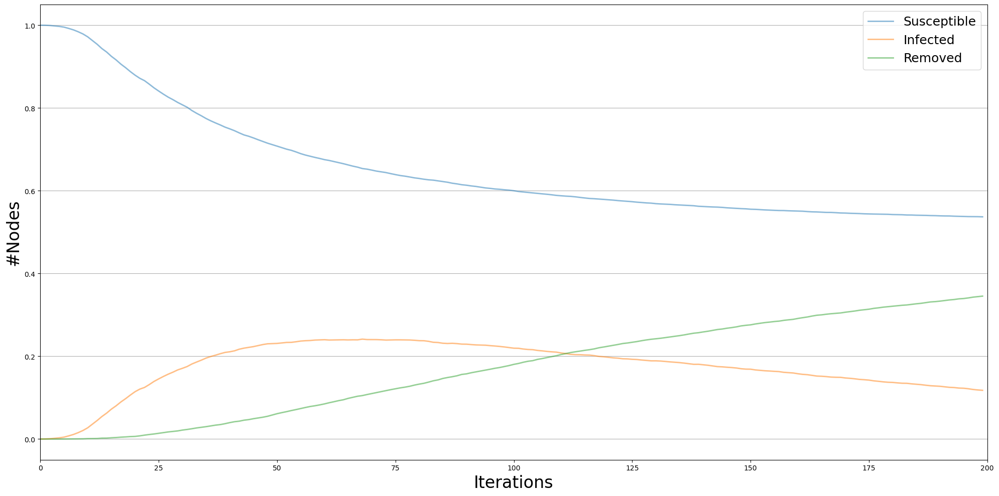

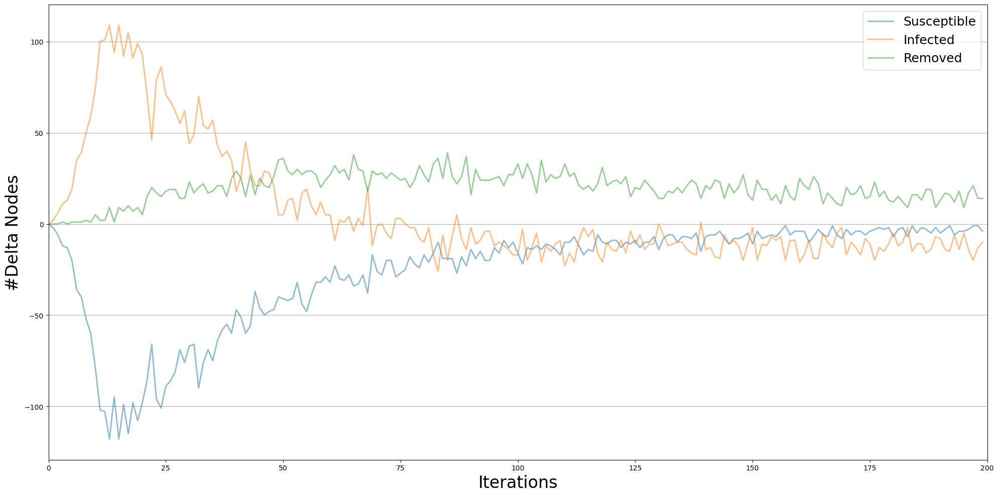

In [206]:
mid_sir_network1_model, mid_sir_network1_trends = build_sir_model(network1, median_infected_network1)
visualise_sir_model(mid_sir_network1_model, mid_sir_network1_trends)

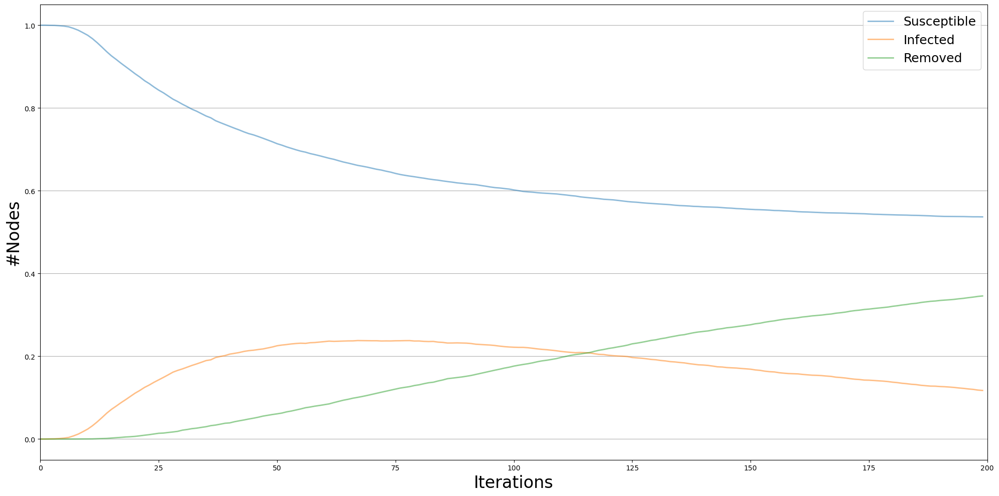

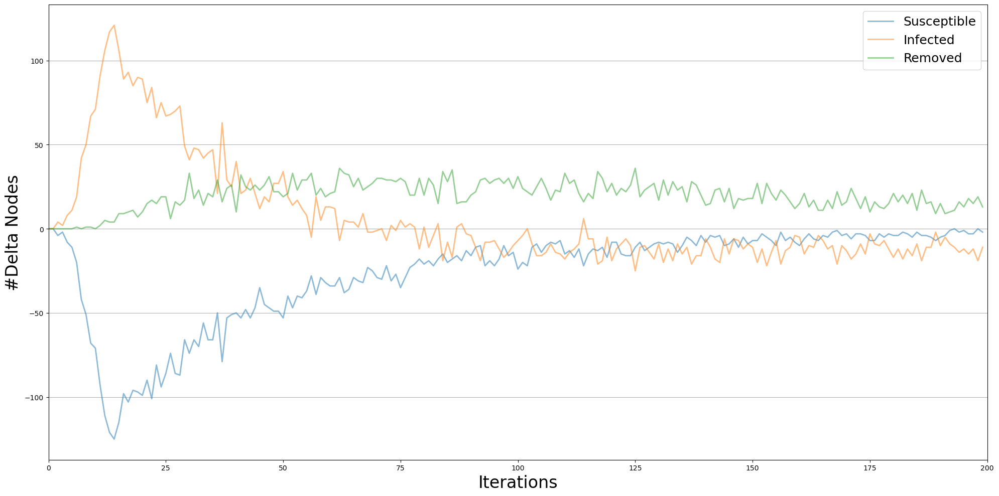

In [207]:
best_sir_network1_model, best_sir_network1_trends = build_sir_model(network1, least_infected_network1)
visualise_sir_model(best_sir_network1_model, best_sir_network1_trends)

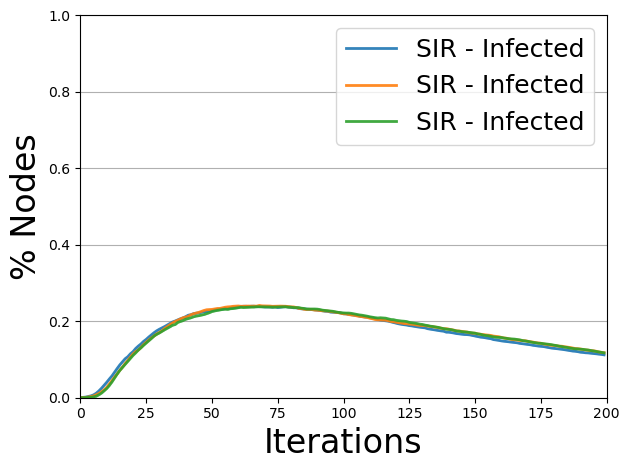

In [208]:
viz = DiffusionTrendComparison(
    [worst_sir_network1_model, mid_sir_network1_model, best_sir_network1_model],
    [worst_sir_network1_trends, mid_sir_network1_trends, best_sir_network1_trends],
    statuses = ['Infected'])

viz.plot ()
plt.show()

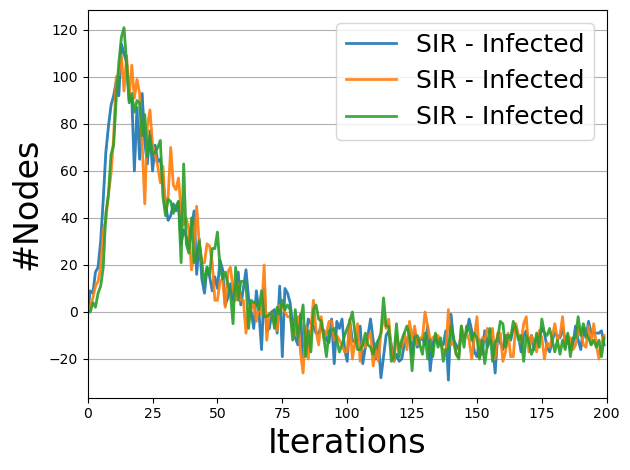

In [209]:
viz = DiffusionPrevalenceComparison(
    [worst_sir_network1_model, mid_sir_network1_model, best_sir_network1_model],
    [worst_sir_network1_trends, mid_sir_network1_trends, best_sir_network1_trends],
    statuses = ['Infected'])

viz.plot ()
plt.show()

By looking at the Trend Comparision and Diffusion Prevalence Comparison for Network 1 we can see that the behavior spreads similarly in all three cases. In a SIR model once a user gets recovered, they can never get infected again. So in the Diffusion Prevalence Comparision we can see that the nodes get infected till the 20th iteration and some of them get recovered as well. As the amount of recovered nodes increases, they can't get infected again, and the behavior slowly dies.

## Network 2

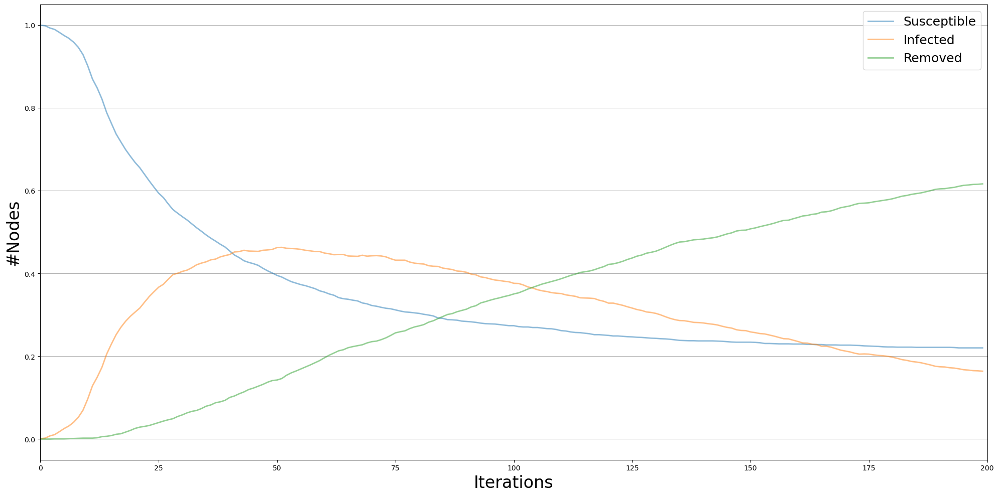

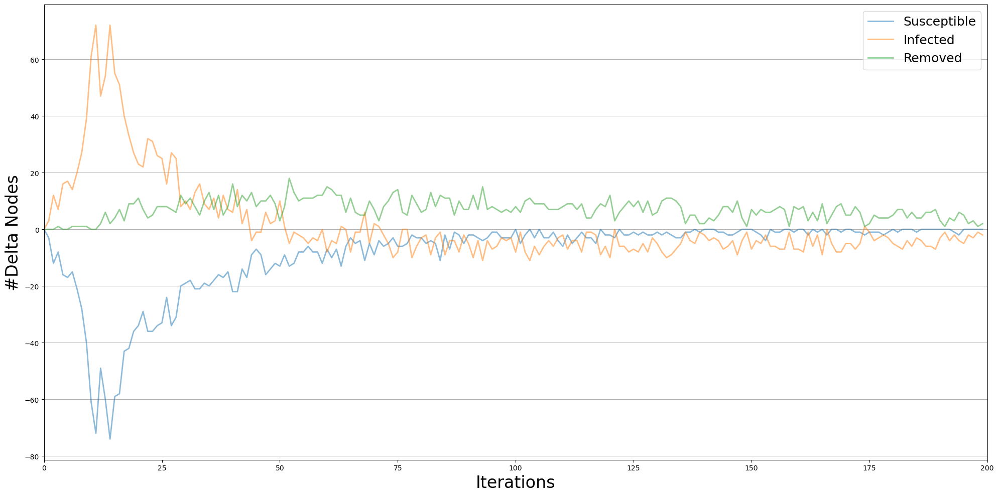

In [210]:
worst_sir_network2_model, worst_sir_network2_trends = build_sir_model(network2, most_infected_network2)
visualise_sir_model(worst_sir_network2_model, worst_sir_network2_trends)

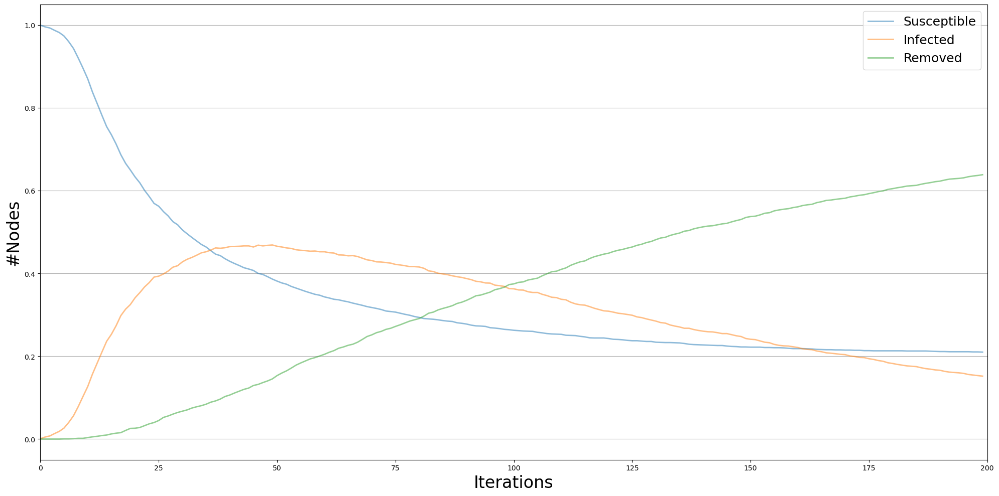

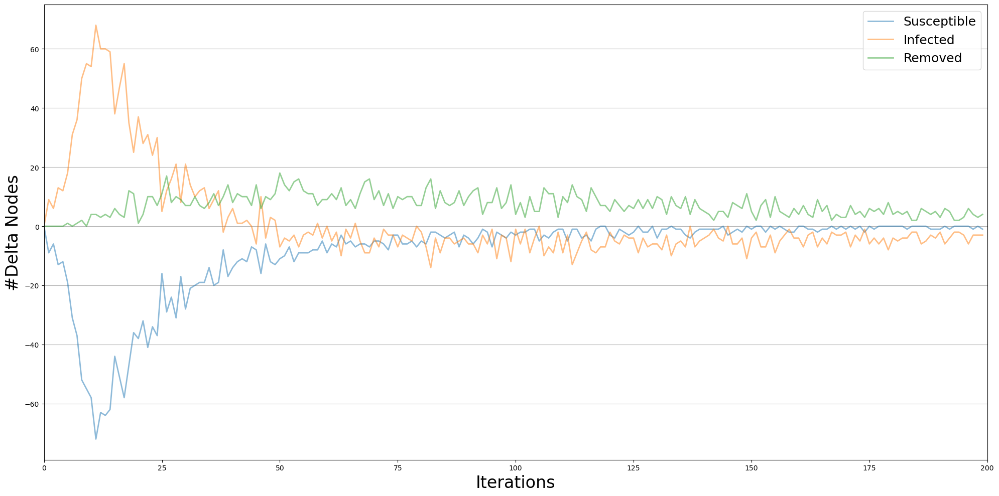

In [211]:
mid_sir_network2_model, mid_sir_network2_trends = build_sir_model(network2, median_infected_network2)
visualise_sir_model(mid_sir_network2_model, mid_sir_network2_trends)

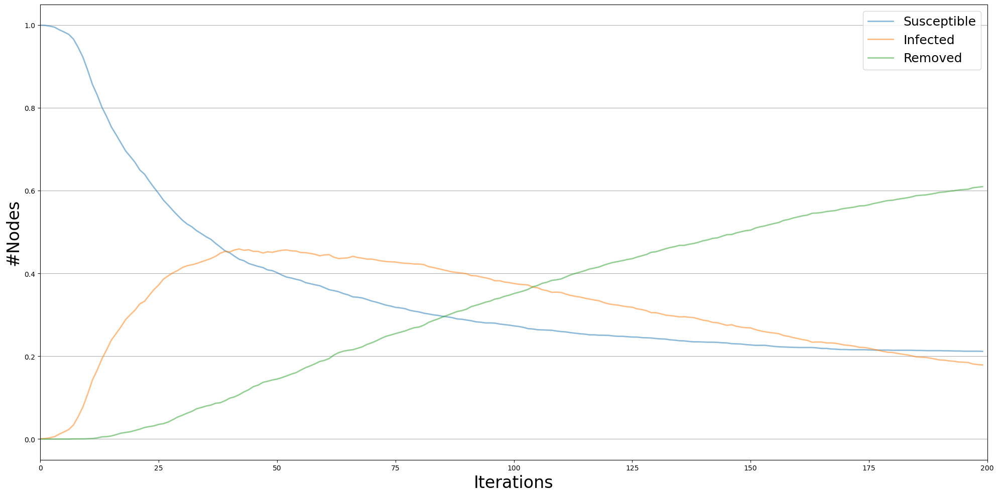

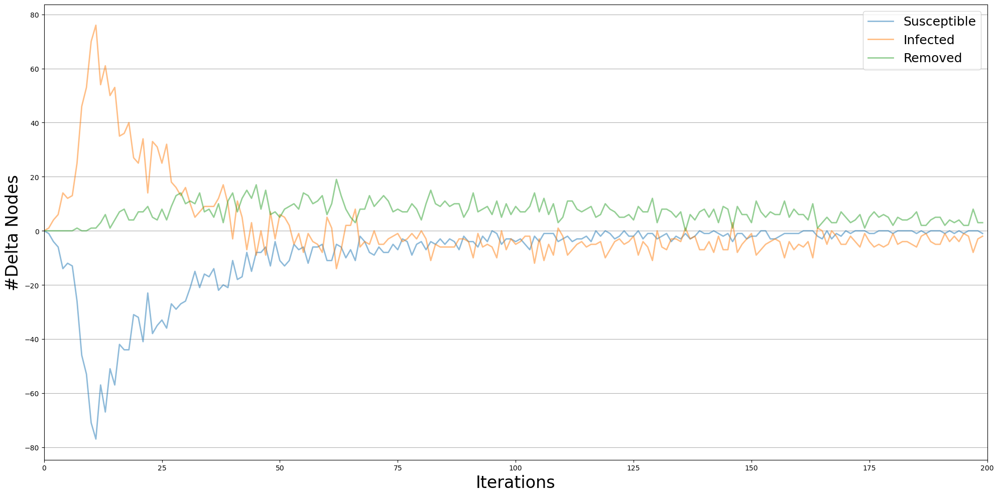

In [212]:
best_sir_network2_model, best_sir_network2_trends = build_sir_model(network2, least_infected_network2)
visualise_sir_model(best_sir_network2_model, best_sir_network2_trends)

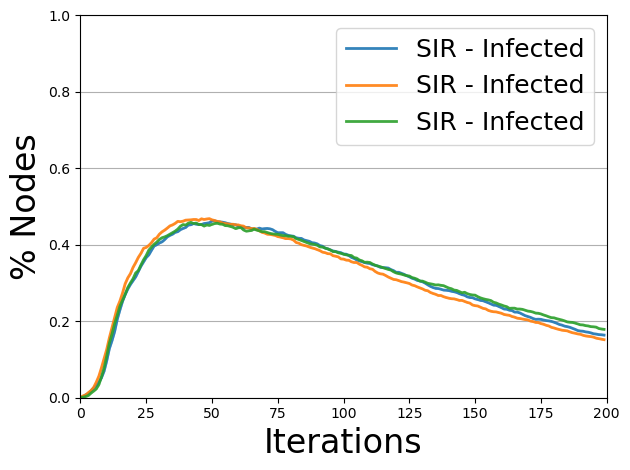

In [213]:
viz = DiffusionTrendComparison(
    [worst_sir_network2_model, mid_sir_network2_model, best_sir_network2_model],
    [worst_sir_network2_trends, mid_sir_network2_trends, best_sir_network2_trends],
    statuses = ['Infected'])

viz.plot ()
plt.show()

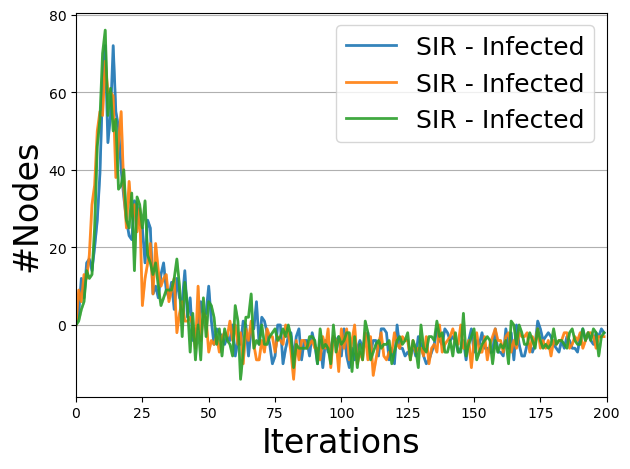

In [214]:
viz = DiffusionPrevalenceComparison(
    [worst_sir_network2_model, mid_sir_network2_model, best_sir_network2_model],
    [worst_sir_network2_trends, mid_sir_network2_trends, best_sir_network2_trends],
    statuses = ['Infected'])

viz.plot ()
plt.show()

Even the second network looks very similar to the first. More than 40% of the users get infected and the behaviour stops spreading after 20 iterations.

## Network 3

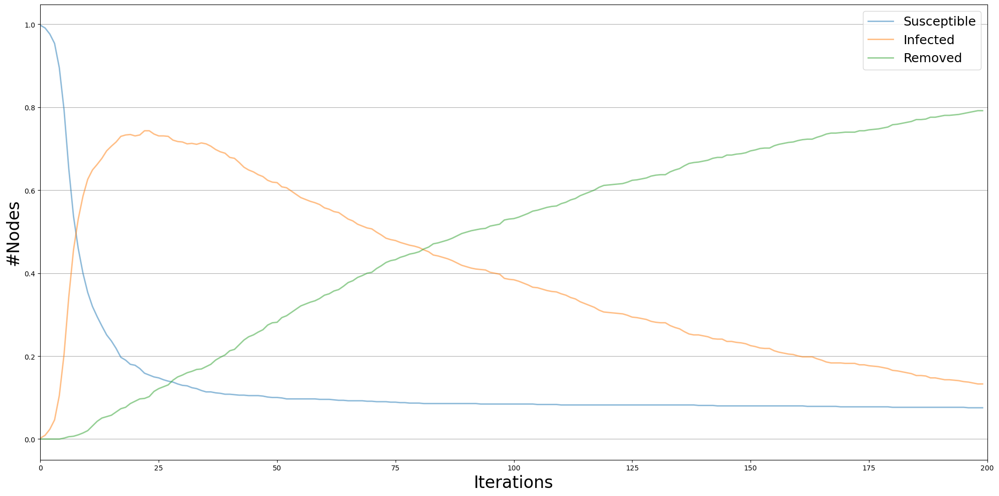

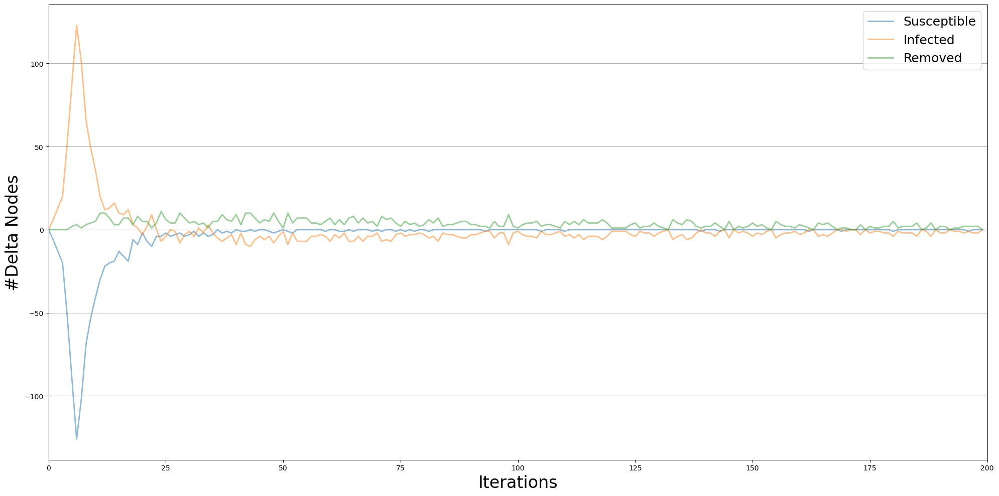

In [215]:
worst_sir_network3_model, worst_sir_network3_trends = build_sir_model(network3, most_infected_network3)
visualise_sir_model(worst_sir_network3_model, worst_sir_network3_trends)

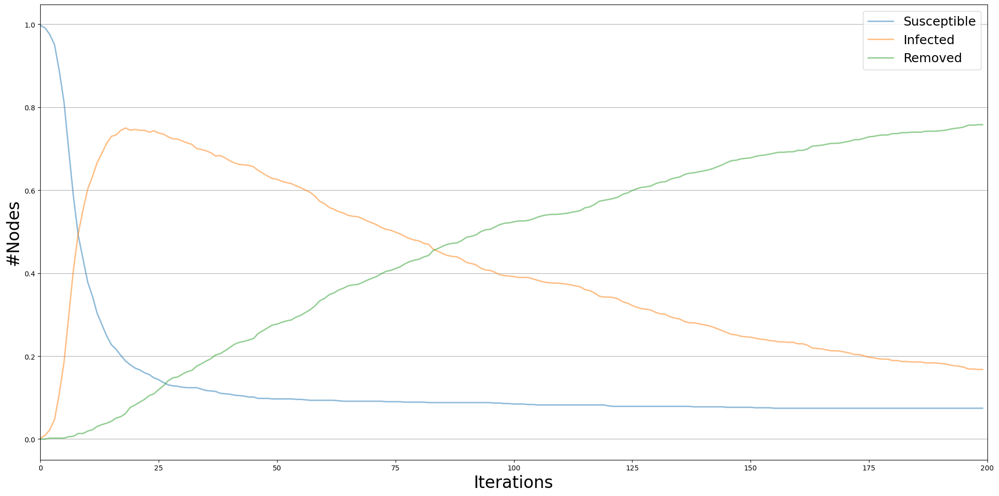

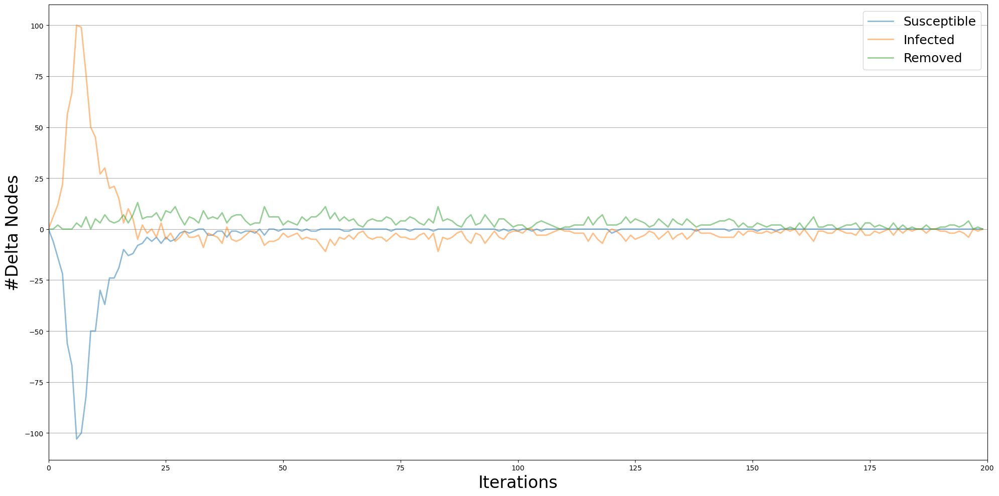

In [216]:
mid_sir_network3_model, mid_sir_network3_trends = build_sir_model(network3, median_infected_network3)
visualise_sir_model(mid_sir_network3_model, mid_sir_network3_trends)

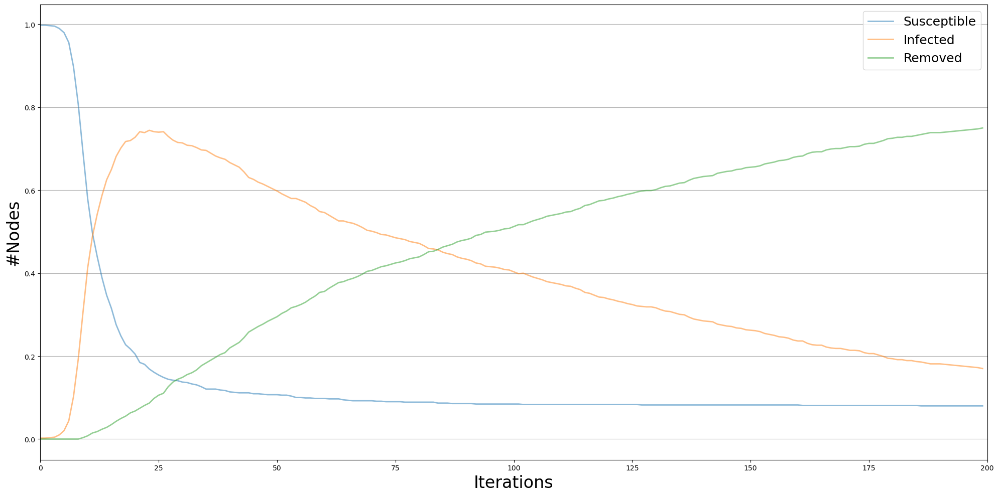

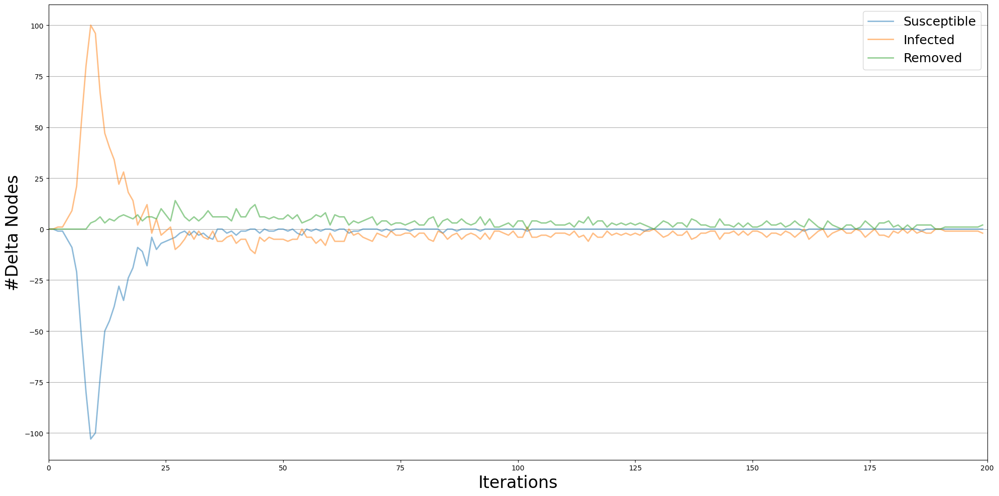

In [217]:
best_sir_network3_model, best_sir_network3_trends = build_sir_model(network3, least_infected_network3)
visualise_sir_model(best_sir_network3_model, best_sir_network3_trends)

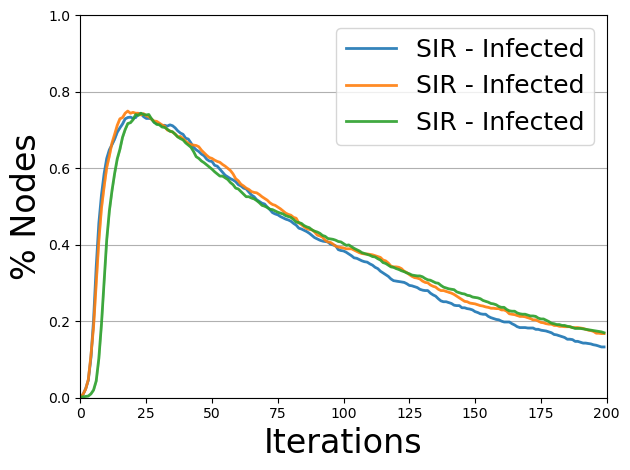

In [218]:
viz = DiffusionTrendComparison(
    [worst_sir_network3_model, mid_sir_network3_model, best_sir_network3_model],
    [worst_sir_network3_trends, mid_sir_network3_trends, best_sir_network3_trends],
    statuses = ['Infected'])

viz.plot ()
plt.show()

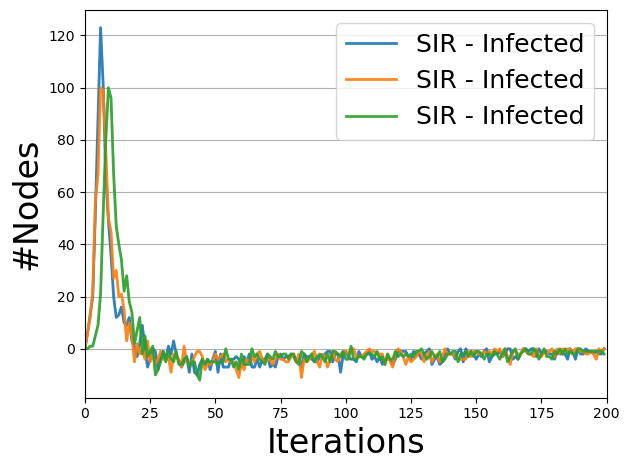

In [219]:
viz = DiffusionPrevalenceComparison(
    [worst_sir_network3_model, mid_sir_network3_model, best_sir_network3_model],
    [worst_sir_network3_trends, mid_sir_network3_trends, best_sir_network3_trends],
    statuses = ['Infected'])

viz.plot ()
plt.show()

In the third network, the spread is much more widespread when compared to networks 1 and 2. More than 75% of the users get affected by the behavior of two users and the recovered number of users increase very steeply after 25 iterations and the spread of behaviour almost becomes 0 after that

The threshold model looks to give us a very good idea about how likely and how quickly the behavior spreads from one user to similar users in very few iterations. Because of this reason, the Foundation should keep a close eye on user behavior and then identify the users who are the most vulnerable to get affected next and try isolating them. We can make use of both Threshold and SIR model to understand the likeliness of the spread of a certain behavior and try to isolate the vulnerable users so that the behavior can be controlled. 

The foundation can also make use of Centrality measures such as Degree Centrality, Closeness Centrality (which shows us a way of detecting nodes that are able to spread information very efficiently through a graph) to identify the nodes that are most vulnarable and isolate them. 

They can also analyze the network structure to identify editors who bridge different communities or clusters in the network. These editors may have a higher likelihood of spreading trolling behavior across different parts of the network and if they are isolated, it will become very easy to control the spread of the behaviour from one cluster to another.

In [220]:
def get_prior_list(network):
    grouped = network.groupby('page_name')

# Count the number of speeches per person in each group
    speakers_counts = {}
    for name, group in grouped:
        speakers_counts[name] = group['username'].value_counts()


    most_speaking_people = {}
    for page, counts in speakers_counts.items():
        most_speaking_people[page] = counts.nlargest(2)

    all_speakers = {}
    for page, group in grouped:
        all_speakers[page] = group['username'].unique()

    most_speaking_people

    G = nx.Graph()

# Add an edge to connect the most contributors on the same discussion page
    for page, speakers in most_speaking_people.items():
        speakers_list = speakers.index.tolist()
        if len(speakers_list) > 1:
            G.add_edge(speakers_list[0], speakers_list[1])


    editor_A,editor_B = random.choices(list(G.nodes),k=2)
#editor_A = 'Ymblanter'
#editor_B = 'DannyS712'

# Calculate the shortest path between editor A and editor B, and their shortest path with other editors in the network

    shortest_path_A_to_B = nx.shortest_path_length(G, source=editor_A, target=editor_B)
    try:
        shortest_path_A_to_B = nx.shortest_path_length(G, source=editor_A, target=editor_B)
        # Calculate the shortest path between editor A and editor B to other editors in the network
        shortest_paths_from_A = nx.single_source_shortest_path_length(G, source=editor_A)
        shortest_paths_from_B = nx.single_source_shortest_path_length(G, source=editor_B)

# Find editors directly connected to editors A and B (shortest path length is 1)
        neighbors_of_A = [editor for editor, path_length in shortest_paths_from_A.items() if path_length == 1]
        neighbors_of_B = [editor for editor, path_length in shortest_paths_from_B.items() if path_length == 1]


        print(f"The shortest path length between {editor_A} and {editor_B}: {shortest_path_A_to_B}")
        print(f"The number of editors directly connected to Editor A: {len(neighbors_of_A)}")
        print(f"The number of editors directly connected to Editor B: {len(neighbors_of_B)}")
    except:
        print("no path")
        



    degree_centrality = nx.degree_centrality(G)
    closeness_centrality = nx.closeness_centrality(G)

# The overall centrality of editors was evaluated by combining degree centrality and proximity centrality
    combined_centrality = {editor: (degree_centrality[editor] + closeness_centrality[editor]) / 2 
                        for editor in G.nodes}

# Sort by global centrality value to determine inspection priority
    priority_list = sorted(combined_centrality.items(), key=lambda x: x[1], reverse=True)

# Print the top 10 editors of the priority list and their centrality values
    print("List of inspection priorities based on centrality (top 10)：")
    for i, (editor, centrality_value) in enumerate(priority_list[:10], start=1):
        print(f"{i}.editor：{editor}, Centrality value：{centrality_value:.4f}")

In [221]:
get_prior_list(users)

The shortest path length between Bsadowski1 and ChongDae: 4
The number of editors directly connected to Editor A: 2
The number of editors directly connected to Editor B: 1
List of inspection priorities based on centrality (top 10)：
1.editor：Liuxinyu970226, Centrality value：0.2688
2.editor：Global message, Centrality value：0.2242
3.editor：Jura1, Centrality value：0.2191
4.editor：Tobias1984, Centrality value：0.2171
5.editor：Jon Harald Søby, Centrality value：0.2153
6.editor：Cycn, Centrality value：0.2142
7.editor：VIGNERON, Centrality value：0.2058
8.editor：לערי ריינהארט, Centrality value：0.2053
9.editor：Ymblanter, Centrality value：0.1942
10.editor：Alexmar983, Centrality value：0.1942


In [222]:
get_prior_list(administrators)

The shortest path length between Brya and Jasper Deng: 5
The number of editors directly connected to Editor A: 1
The number of editors directly connected to Editor B: 9
List of inspection priorities based on centrality (top 10)：
1.editor：Ymblanter, Centrality value：0.2760
2.editor：DannyS712, Centrality value：0.2609
3.editor：MisterSynergy, Centrality value：0.2452
4.editor：Jasper Deng, Centrality value：0.2412
5.editor：Stryn, Centrality value：0.2119
6.editor：AmaryllisGardener, Centrality value：0.1991
7.editor：Pigsonthewing, Centrality value：0.1966
8.editor：Mahir256, Centrality value：0.1957
9.editor：Innocent bystander, Centrality value：0.1940
10.editor：Mbch331, Centrality value：0.1924


In [224]:
get_prior_list(request_for_comment)

The shortest path length between Circeus and FelixReimann: 4
The number of editors directly connected to Editor A: 1
The number of editors directly connected to Editor B: 1
List of inspection priorities based on centrality (top 10)：
1.editor：Pasleim, Centrality value：0.2409
2.editor：John F. Lewis, Centrality value：0.2064
3.editor：ArthurPSmith, Centrality value：0.1773
4.editor：Jasper Deng, Centrality value：0.1633
5.editor：ChristianKl, Centrality value：0.1577
6.editor：GZWDer, Centrality value：0.1573
7.editor：Micru, Centrality value：0.1522
8.editor：Rschen7754, Centrality value：0.1508
9.editor：Izno, Centrality value：0.1409
10.editor：GerardM, Centrality value：0.1324


A list of inspection priorities was determined based on centrality (the top 10), and these editors had higher overall centrality values in the network and were therefore considered to have greater influence and importance in the community. This means that if there is "spoofing", these editors may be key information disseminators or affected people and should be checked first

## Task D (comparing networks and social issues): 

Consider the following two facts:
- Despite all belonging to the same community, the 3 different graphs you have selected above may yield different results. They may contain different topologies sitting at various places in the regular/random network spectrum, with different degrees of being “small world networks” 
- Despite the definition we have used to connect two editors, there is a subjective and social aspect to decide when and how to establish an edge between the nodes of two editors. This can make obvious links in the network not so obvious (and less prone to propagation) and thus have effects in the analysis. We want to use network metrics on the Wikidata editor network to assess the quality of its links.  

### How do the 3 networks that you have chosen compare in terms of the results of the previous tasks? Where do these 3 networks sit in the regular, small world, and random network continuum? What metrics and results tell you that this might be the case, and how confident can you be about them?

First, let's consider the characteristics of each network: **small, regular, and random network**.

**Small World Network**
- High clustering
- Low diameter

**Regular Network**
- High clustering
- High diameter

**Random Network**
- Low clustering
- Low diameter


Overall, the Wikidata editor network exhibits structural characteristics that align closely with those of **small-world networks** rather than random or regular networks. This classification is primarily supported by key metrics such as the average clustering coefficient, the average shortest path length, and the length of diameter. The network demonstrates a high average clustering coefficient, indicating a propensity for nodes to form tightly-knit clusters or groups. Simultaneously, it showcases relatively short average shortest path lengths, suggesting that most nodes can be reached from any other node in a small number of steps. This combination of high local clustering and efficient global connectivity is characteristic of small-world networks, where nodes are highly interconnected, yet the overall structure retains elements of both local clustering and global connectivity. Moreover, the Wikidata editor network's tendency to display the "small-world phenomenon," where nodes are highly clustered yet closely connected, further reinforces its classification within the small-world network group. Overall, the wiki network's structural properties and organizational dynamics closely resemble those of small-world networks, highlighting its position within this network continuum.

Additionally, the diameter of the Wikidata editor network further supports its classification as a small-world network. A smaller diameter implies shorter maximum distances between nodes, reinforcing the network's efficient communication pathways and highlighting its cohesive structure. This comparison can be found in task B.

However, not all networks will display these properties to the same degree.

**User Network (Large Network)**:

The user network demonstrates moderate to high values across small-world metrics, including a relatively high average clustering coefficient of 0.1827 and a relatively short average shortest path length of 0.0836.
However, compared to the other two networks, its clustering coefficient is lower, indicating somewhat weaker local clustering. This suggests that while the user network has characteristics of a small-world network, it may not exhibit as strong of a balance between local clustering and global connectivity as the other networks.

**Administrators Network (Medium Network)**:

The administrators network exhibits notably high values for small-world metrics, with an average clustering coefficient of 0.6195 and an average shortest path length of 0.0597.
These metrics suggest strong local clustering and efficient global connectivity. The network displays small-world properties to a higher degree compared to the user network, indicating a more pronounced balance between local clustering and global connectivity.

**Requests_for_Comments Network (Small Network)**:

The requests_for_comments network demonstrates the highest values for small-world metrics among the three networks, with an average clustering coefficient of 0.7818 and an average shortest path length of 0.0757.
These values indicate very strong local clustering and efficient global connectivity. The network displays small-world properties to the highest degree among the three networks, suggesting a robust balance between local clustering and global connectivity.

While the diameters of all three networks are relatively small considering their sizes, the administrators and requests_for_comments networks stand out for their exceptionally efficient communication pathways and tighter network cohesion.

**Why the Wikidata editor network is not a random network?**

None of the provided networks demonstrate the low clustering coefficients typically associated with random networks. Instead, they all exhibit high clustering coefficients, indicating that nodes tend to form tightly-knit clusters or communities. 

**Why the Wikidata editor network is not a regular network?**

While the provided networks demonstrate high clustering coefficients, their relatively short average shortest path lengths and diameters suggest that they do not possess the long path lengths and diameters expected in regular networks.

### What kind of problems (bias, identity, etc.) can impact the quality of the network?

Several issues can impact the quality of the network, introducing potential biases and identity-related challenges. Bias may arise from sampling methods, leading to an incomplete representation of the community or skewed results. The subjective nature of establishing edges introduces identity-related problems, where social decisions may influence link representation, potentially resulting in misrepresented connections or overlooked affiliations.

### What network metrics, and combinations thereof, could be effective for assessing link quality and resolving identity?

To assess link quality and address identity-related challenges, a combination of network metrics proves effective. Centrality measures, including betweenness and closeness centrality, help identify influential nodes, while clustering coefficients reveal cohesive subgroups. PageRank offers insights into the influence of specific editors, and community detection algorithms, such as Louvain or Girvan-Newman, unveil natural community structures. This multifaceted approach provides a comprehensive evaluation of link quality and identity representation, recognizing the dynamic and subjective nature of social networks. It is essential to acknowledge that while these metrics offer valuable insights, no single metric is foolproof, and a holistic analysis requires considering multiple perspectives.